<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Create-dictionary-of-sample-details" data-toc-modified-id="Create-dictionary-of-sample-details-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Create dictionary of sample details</a></span></li><li><span><a href="#Import-the-variant-calls/-trajectories" data-toc-modified-id="Import-the-variant-calls/-trajectories-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Import the variant calls/ trajectories</a></span></li><li><span><a href="#Lists-of-which-are-linear,-clonal-interference-of-late" data-toc-modified-id="Lists-of-which-are-linear,-clonal-interference-of-late-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Lists of which are linear, clonal interference of late</a></span></li><li><span><a href="#Import-germline-variants" data-toc-modified-id="Import-germline-variants-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Import germline variants</a></span></li><li><span><a href="#Put-a-bound-on-VAF-for-mutations-that-disappear-or-only-appear-late" data-toc-modified-id="Put-a-bound-on-VAF-for-mutations-that-disappear-or-only-appear-late-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Put a bound on VAF for mutations that disappear or only appear late</a></span></li><li><span><a href="#Import-the-inferred-fitness-and-establishment-times" data-toc-modified-id="Import-the-inferred-fitness-and-establishment-times-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Import the inferred fitness and establishment times</a></span></li><li><span><a href="#Plot-the-clone-and-mutation-trajectories" data-toc-modified-id="Plot-the-clone-and-mutation-trajectories-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Plot the clone and mutation trajectories</a></span></li><li><span><a href="#Samples" data-toc-modified-id="Samples-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Samples</a></span><ul class="toc-item"><li><span><a href="#Cases" data-toc-modified-id="Cases-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>Cases</a></span></li><li><span><a href="#Controls" data-toc-modified-id="Controls-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Controls</a></span></li><li><span><a href="#C92_022-(manually-optimised)" data-toc-modified-id="C92_022-(manually-optimised)-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span>C92_022 (manually optimised)</a></span><ul class="toc-item"><li><span><a href="#For-calculating-likelihood" data-toc-modified-id="For-calculating-likelihood-8.3.1"><span class="toc-item-num">8.3.1&nbsp;&nbsp;</span>For calculating likelihood</a></span></li><li><span><a href="#Calaculating-likelihood-and-plotting-(manual-optimisation)" data-toc-modified-id="Calaculating-likelihood-and-plotting-(manual-optimisation)-8.3.2"><span class="toc-item-num">8.3.2&nbsp;&nbsp;</span>Calaculating likelihood and plotting (manual optimisation)</a></span></li></ul></li></ul></li></ul></div>

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [118]:
# import packages
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import math
import scipy.special
from scipy.special import loggamma
import pandas as pd
import csv
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
import ast
import matplotlib.patches as patches

In [6]:
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'Helvetica'

In [7]:
#define the colors from colorbrewer2
grey1 = '#f7f7f7'
grey2 = '#cccccc'
grey3 = '#969696'
grey4 = '#636363'
grey5 = '#252525'

In [8]:
mutation_classes = {'NPM1': 'NPM1',
                   'DNMT3A': 'DNA methylation',
                   'TET2': 'DNA methylation',
                   'IDH1': 'DNA methylation',
                   'IDH2': 'DNA methylation',
                   'ASXL1': 'Chromatin modifiers',
                   'EZH2': 'Chromatin modifiers',
                   'RUNX1': 'Transcription factors',
                   'CEBPA': 'Transcription factors',
                   'GATA2': 'Transcription factors',
                   'BCOR': 'Transcriptional corepressors',
                   'BCORL1': 'Transcriptional corepressors',
                   'TP53': 'Tumour suppressor',
                   'PPM1D': 'Tumour suppressor',
                   'CHEK2': 'Tumour suppressor',
                   'WT1': 'Tumour suppressor',
                   'CBL': 'Tumour suppressor',
                   'DDX41': 'Tumour suppressor',
                   'SRSF2': 'Spliceosome',
                   'SF3B1': 'Spliceosome',
                   'U2AF1': 'Spliceosome',
                   'ZRSR2': 'Spliceosome',
                   'RAD21': 'Cohesin',
                   'STAG2': 'Cohesin',
                   'FLT3': 'Cell signalling',
                   'KIT': 'Cell signalling',
                   'JAK2': 'Cell signalling',
                   'KRAS': 'Cell signalling',
                   'NRAS': 'Cell signalling',
                   'PTPN11': 'Cell signalling',
                   'CSF3R': 'Cell signalling',
                   'GNB1': 'Cell signalling',
                   'GNAS': 'Cell signalling',
                   'MPL': 'Cell signalling',
                    'mCA': 'mCA',
                   '15q CNLOH': 'mCA',
                   '4q CNLOH': 'mCA',
                   '4 gain?': 'mCA',
                   'X gain': 'mCA',
                    'chrX': 'mCA',
                    'chr19p': 'mCA',
                    'chr9p': 'mCA',
                    'chr7q': 'mCA',
                    'chr4': 'mCA',
                    'chr4q': 'mCA',
                    'chr15q': 'mCA',
                   '19p CNLOH': 'mCA',
                   '9p CNLOH': 'mCA',
                   '7q CNLOH': 'mCA',
                   'X': 'missing driver',
                   'Z': 'missing driver 2'}

In [9]:
multiple_mutant_clone_colors = {1: {1: ['#6ba3d6'],
                                   2: ['#2171b5', '#9ecae1'],
                                   3: ['#08306b', '#2171b5', '#9ecae1'],
                                   4: ['#08306b', '#2171b5', '#9ecae1', '#deebf7'],
                                   5: ['#08306b', '#08519c', '#4292c6', '#9ecae1', '#deebf7']},
                               2: {1: ['#41ab5d'],
                                  2: ['#006d2c', '#74c476'],
                                  3: ['#00441b', '#238b45', '#a1d99b'],
                                  4: ['#00441b', '#238b45', '#a1d99b', '#e5f5e0']},
                               3: {1: ['#fd8d3c'],
                                  2: ['#ec7014', '#fed976'],
                                  3: ['#cc4c02', '#fe9929', '#fee391'],
                                  4: ['#993404', '#ec7014', '#fec44f', '#ffeda0'],
                                  5: ['#662506', '#cc4c02', '#fe9929', '#fed976', '#fff7bc'],
                                  6: ['#662506', '#993404', '#cc4c02', '#fe9929', '#fed976', '#fff7bc']},
                               4: {1: ['#da2b2b'],
                                  2: ['#bc2221', '#f0a1a1'],
                                  3: ['#bc2221', '#e9807f', '#fad4d4'],
                                  4: ['#9b191c', '#da2b2b', '#f0a1a1', '#fad4d4'],
                                  5: ['#791614', '#b9181f', '#eb5770', '#f3a0a3', '#fad4d4']},
                               5: {1: ['#834594'],
                                  2: ['#834594', '#ba9bc9']},
                               6: {1: ['#4e4d4d']}}

# Create dictionary of sample details

In [24]:
#create a dictionary of the sample details
cases = {} #e.g. {'C92_002': ['C92_002_s1', 'C92_002_s2', 'C92_002_s3', 'C92_002_s4'....]}
controls = {} #e.g. {'CNTRL_001': ['CNTRL_001_s1', 'CNTRL_001_s10', 'CNTRL_001_s2'...]}
cases_and_controls = {}
sample_ages = {} #e.g. {'C92_002_s1': 73.73, 'C92_002_s2': 75.0, 'C92_002_s3': 75.83...}
sample_ages_dict = {} #e.g. C92_002 = [73.73, 75.0, 75.83...]
sample_ages_dict_names = {} #e.g. {C92_002: {73.73: C92_002_s1, 75.0: C92_002_s2...}}
sample_diagnosis_age = {} #e.g. {'C92_002': 81.1, 'C92_003': 75.21, 'C92_005': 70.09...}
sample_DNA_amount = {} #e.g. {'C92_002_s1': '45', 'C92_002_s2': '50', 'C92_002_s3': '50'...}
matched_sample = {} #e.g. {'C92_002': 'CNTRL_169', 'C92_003': 'CNTRL_002'...}

with open('Data_files/UKCTOCS_samples_processed_information.csv') as csvfile:
    readreader = csv.reader(csvfile)
    row_count=0
    for row in readreader:
        if row_count>0:
            sample_name = row[1].split('_')[0]+'_'+row[1].split('_')[1]
            timepoint = row[1]
            sample_ages[timepoint]=float(row[6]) #dictionary of e.g. C92_007_s2 = 76
            
            if sample_name in sample_ages_dict.keys():
                sample_ages_dict[sample_name].append(float(row[6]))
            else:
                sample_ages_dict[sample_name]=[float(row[6])]
                
            if sample_name in sample_ages_dict_names.keys():
                sample_ages_dict_names[sample_name][float(row[6])]=timepoint
            else:
                sample_ages_dict_names[sample_name]={float(row[6]): timepoint}
                
            sample_DNA_amount[timepoint]=row[2]
            if row[7]!='':
                if '_' in row[7]:
                    matched_sample_name = row[7].split('_')[0]+'_'+row[7].split('_')[1]
                    matched_sample[sample_name]=matched_sample_name
                    
            if sample_name in cases_and_controls.keys():
                cases_and_controls[sample_name].append(timepoint)
            else:
                cases_and_controls[sample_name]=[timepoint]
                    
            if row[0]=='Case':
                if sample_name in cases.keys():
                    cases[sample_name].append(timepoint)
                else:
                    cases[sample_name]=[timepoint]
                    
                sample_diagnosis_age[sample_name]=float(row[5])
                
            if row[0]=='Control':
                if sample_name in controls.keys():
                    controls[sample_name].append(timepoint)
                else:
                    controls[sample_name]=[timepoint]
                if sample_name in matched_sample.keys():
                    sample_diagnosis_age[sample_name]=sample_diagnosis_age[matched_sample[sample_name]]

        row_count+=1

sample_ages_lists = {}
for k, v in sample_ages_dict.items():
    sample_ages_lists[k] = sorted(v)
        
cases_and_controls_sorted = {}
for k, v in cases_and_controls.items():
    ages_sorted = []
    for i in v:
        timepoint_number = int(i.split('_')[2][1:])
        ages_sorted.append((timepoint_number, i))
    sorted_v = sorted(ages_sorted, reverse = False)
    cases_and_controls_sorted[k]=[]
    for i in sorted_v:
        cases_and_controls_sorted[k].append(i[1])
        
# cases_and_controls_sorted

# Import the variant calls/ trajectories

In [25]:
#dataframe of variant trajectories
df = pd.read_csv("Data_files/UKCTOCS_watson_non-germline_variants_calls_SNVs_indels_mCAs_April_2024.csv")
df.head()

,sample name,age_sample_taken,months_to_diagnosis,age_at_AML_diagnosis,matched_sample,chromosome,start,end,REF,ALT,...,cosmic_total,cosmic_haem_lymphoid,cosmic_sites,exac_all,gnomad_all,clinvar_allele_id,clinvar_dn,clinvar_disdb,clinvar_rev,clin_sig
0,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr2,198266834.0,198266834.0,T,C,...,655,523.0,"2(lung),1(oesophagus),15(pancreas),17(NS),4(bi...",0.0002,.,362883,Acute_myeloid_leukemia,Human_Phenotype_Ontology:HP:0004808\x2cMeSH:D0...,no_assertion_criteria_provided,Likely_pathogenic
1,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr2,25467059.0,25467059.0,G,A,...,3,2.0,"1(NS),2(haematopoietic_and_lymphoid_tissue)",.,.,.,.,.,.,.
2,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr4,106157699.0,106157700.0,AT,A,...,0,0.0,.,0,.,.,.,.,.,.
3,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr4,106155418.0,106155418.0,C,CTT,...,0,0.0,.,0,.,.,.,.,.,.
4,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr20,57484420.0,57484420.0,C,T,...,819,3.0,"17(ovary),3(kidney),8(thyroid),84(large_intest...",8.238e-06,.,30972,Hepatocellular_carcinoma|Neoplasm|Pancreatic_a...,Human_Phenotype_Ontology:HP:0001402\x2cMedGen:...,no_assertion_criteria_provided,Pathogenic/Likely_pathogenic


In [26]:
def sample_trajectories(person_ID, df): #extract trajectories of each variant for a given sample, e.g. 'C92_002'

    filtered_df = df[df['sample name'].str.startswith(person_ID)]

#     person_variant_dict={}
    var_dict={}
    variant_details = {}
#     person_variant_dict[person_ID]=var_dict

    gene_variant = ''

    for index, row in filtered_df.iterrows():
        # Access data for each column by column name
        variant_type=row['variant_type']
#         if row['VAF (cell fraction for mCAs)'] != 'not processed':
        if variant_type=='SNV':
            variant=row['AA_change']
            gene=row['gene']
            VAF=float(row['VAF (cell fraction for mCAs)'])
            age=row['age_sample_taken']
            gene_variant=gene+'_'+variant
        elif (variant_type=='CNLOH' or variant_type=='gain' or variant_type=='gain?' or variant_type=='loss'):
            VAF=row['VAF (cell fraction for mCAs)']
            age=row['age_sample_taken']
            chromosome=row['chromosome']
            gene_variant=chromosome+'_'+variant_type
        elif (variant_type=='Deletion' or variant_type=='Insertion' or variant_type=='Complex'):
            VAF=float(row['VAF (cell fraction for mCAs)'])
            variant=row['AA_change']
            age=row['age_sample_taken']
            gene=row['gene']
            gene_variant=gene+'_'+variant
        elif (variant_type=='ITD'):
            VAF=float(row['VAF (cell fraction for mCAs)'])
            variant=row['AA_change']
            age=row['age_sample_taken']
            gene=row['gene']
            gene_variant=gene+'_'+variant
            
        if gene_variant in var_dict.keys():
            if VAF != 'not processed':
                var_dict[gene_variant][age]=float(VAF)
        else:
            if VAF != 'not processed':
                var_dict[gene_variant]={age: float(VAF)}
            
        if gene_variant != '':
            if variant_type not in ('CNLOH', 'gain', 'gain?', 'loss'):
                chromosome = row['chromosome']
                start = int(row['start'])
                ref = row['REF']
                variant_details[gene_variant]=(chromosome, start, ref)
            else:
                variant_details[gene_variant]=(chromosome, '', '')

    return var_dict, variant_details

In [41]:
def dictionary_sample_details(sample_ID):

    sample_ages = {} #e.g. {'C92_002_s1': 73.73, 'C92_002_s2': 75.0, 'C92_002_s3': 75.83...}
    sample_ages_dict = {} #e.g. C92_002 = [73.73, 75.0, 75.83...]
    sample_ages_dict_names = {} #e.g. {C92_002: {73.73: C92_002_s1, 75.0: C92_002_s2...}}
    sample_diagnosis_age = {} #e.g. {'C92_002': 81.1, 'C92_003': 75.21, 'C92_005': 70.09...}
    # sample_DNA_amount = {} #e.g. {'C92_002_s1': '45', 'C92_002_s2': '50', 'C92_002_s3': '50'...}
    matched_sample = {} #e.g. {'C92_002': 'CNTRL_169', 'C92_003': 'CNTRL_002'...}

    with open('Data_files/UKCTOCS_samples_processed_information.csv') as csvfile:
        readreader = csv.reader(csvfile)
        row_count=0
        for row in readreader:
            if row_count>0:
                sample_name = row[1].split('_')[0]+'_'+row[1].split('_')[1]
                timepoint = row[1]
                sample_ages[timepoint]=float(row[6]) #dictionary of e.g. C92_007_s2 = 76

                if sample_name in sample_ages_dict.keys():
                    sample_ages_dict[sample_name].append(float(row[6]))
                else:
                    sample_ages_dict[sample_name]=[float(row[6])]

                if sample_name in sample_ages_dict_names.keys():
                    sample_ages_dict_names[sample_name][float(row[6])]=timepoint
                else:
                    sample_ages_dict_names[sample_name]={float(row[6]): timepoint}

                if row[7]!='':
                    if '_' in row[7]:
                        matched_sample_name = row[7].split('_')[0]+'_'+row[7].split('_')[1]
                        matched_sample[sample_name]=matched_sample_name

                if row[0]=='Case':
                    sample_diagnosis_age[sample_name]=float(row[5])

                if row[0]=='Control':
                    if sample_name in matched_sample.keys():
                        sample_diagnosis_age[sample_name]=sample_diagnosis_age[matched_sample[sample_name]]

            row_count+=1

    sample_ages_lists = {}
    for k, v in sample_ages_dict.items():
        sample_ages_lists[k] = sorted(v)

    diagnosis_age = sample_diagnosis_age[sample_ID]
    ages_dict_names = sample_ages_dict_names[sample_ID]

    return sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age

# Lists of which are linear, clonal interference of late

In [28]:
linear_evolution = ['C92_002', 
                    'C92_003',
                    'C92_005',
                    'C92_007',
                    'C92_011',
                    'C92_018',
                    'C92_019',
                    'C92_024',
                    'C92_032',
                    'C92_033',
                    'C92_034',
                    'C92_041',
                    'C92_042',
                    'C92_049',
                    'C92_051',
                    'C92_053',
                    'C92_057',
                    'C92_058',
                    'C92_061',
                    'C92_062',
                    'C92_064',
                    'C92_065',
                    'C92_067',
                    'C92_068',
                    'C92_070', #??linear or olate
                    'C92_086', 
                    'CNTRL_001', 
                    'CNTRL_002', 
                    'CNTRL_004', 
                    'CNTRL_122', 
                    'CNTRL_160', 
                    'CNTRL_162', 
                    'CNTRL_163', 
                    'CNTRL_164', 
                    'CNTRL_166', 
                    'CNTRL_167', 
                    'CNTRL_168', 
                    'CNTRL_169', 
                    'CNTRL_172', 
                    'CNTRL_173', 
                    'CNTRL_175', 
                    'CNTRL_178', 
                    'CNTRL_179', 
                    'CNTRL_180', 
                    'CNTRL_182', 
                    'CNTRL_183', 
                    'CNTRL_184',
                    'CNTRL_185',
                    'CNTRL_186', 
                    'CNTRL_187', 
                    'CNTRL_190', 
                    'CNTRL_191', 
                    'CNTRL_193', 
                    'CNTRL_194', 
                    'CNTRL_195', 
                    'CNTRL_196', 
                    'CNTRL_197', 
                    'CNTRL_199', 
                    'CNTRL_202', 
                    'CNTRL_204']

print(len(linear_evolution))

60


In [29]:
clonal_interference = ['C92_008',
                       'C92_009',
                       'C92_012',
                       'C92_022',
                       'C92_023',
                       'C92_036',
                       'C92_045',
                       'C92_050',
                       'C92_054',
                       'C92_056',
                       'C92_066',
                       'C92_088',
                       'C92_090',
                      'CNTRL_005',
                      'CNTRL_192',
                      'CNTRL_201']

print(len(clonal_interference))

16


In [30]:
late_evolution = ['C92_015',
                  'C92_039',
                  'C92_043',
                  'C92_044',
                  'C92_047',
                  'C92_048',
                  'C92_052',
                  'C92_055',
                  'C92_063',
                  'C92_072',
                  'CNTRL_203']

print(len(late_evolution))

11


In [31]:
linear_late_evolution = ['C92_016']

# Import germline variants

In [32]:
#dataframe of germline variants
df_germline = pd.read_csv("Data_files/UKCTOCS_watson_all_germline_variants_calls_April_2024.csv")
df_germline.head()

,sample name,age_sample_taken,months_to_diagnosis,age_at_AML_diagnosis,matched_sample,chromosome,start,end,REF,ALT,...,cosmic_total,cosmic_haem_lymphoid,cosmic_sites,exac_all,gnomad_all,clinvar_allele_id,clinvar_dn,clinvar_disdb,clinvar_rev,clin_sig
0,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chrX,129147079.0,129147079.0,T,C,...,23.0,0.0,23(upper_aerodigestive_tract),1.0,1.0,.,.,.,.,.
1,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr17,7579472.0,7579472.0,G,C,...,195.0,0.0,"21(soft_tissue),38(large_intestine),2(thyroid)...",0.66,0.6194,27390,CODON_72_POLYMORPHISM|Li-Fraumeni_syndrome_1|H...,.|Gene:553989\x2cMedGen:C1835398\x2cOMIM:15162...,reviewed_by_expert_panel,drug_response
2,C92_002_s1,73.73,88.37,81.1,CNTRL_169_s1,chr20,31022959.0,31022959.0,T,C,...,0.0,0.0,.,1.0,1.0,137338,not_specified,MedGen:CN169374,no_assertion_provided,not_provided
3,C92_002_s2,75.00,73.19,81.1,CNTRL_169_s2,chrX,129147079.0,129147079.0,T,C,...,23.0,0.0,23(upper_aerodigestive_tract),1.0,1.0,.,.,.,.,.
4,C92_002_s2,75.00,73.19,81.1,CNTRL_169_s2,chr17,7579472.0,7579472.0,G,C,...,195.0,0.0,"21(soft_tissue),38(large_intestine),2(thyroid)...",0.66,0.6194,27390,CODON_72_POLYMORPHISM|Li-Fraumeni_syndrome_1|H...,.|Gene:553989\x2cMedGen:C1835398\x2cOMIM:15162...,reviewed_by_expert_panel,drug_response


In [33]:
def germline_variants(person_ID, df_germline): #extract trajectories of each variant for a given sample, e.g. 'C92_002'

    filtered_df_germline = df_germline[df_germline['sample name'].str.startswith(person_ID)]

    germline_dict={}
    germline_list = []
    significant_germline = []
    significant_germline_with_hom_het = []
    all_germline = {}

    for index, row in filtered_df_germline.iterrows():
        # Access data for each column by column name
        variant_type=row['variant_type']
        variant=row['AA_change']
        gene=row['gene']
        VAF=float(row['VAF (cell fraction for mCAs)'])
        age=row['age_sample_taken']
        gene_variant=gene+'_'+variant
        exac = row['exac_all']
        clin_sig = row['clin_sig']
        clinvar_dn = row['clinvar_dn']
        cosmic_haem = row['cosmic_haem_lymphoid']
        cosmic_total = row['cosmic_total']

        if gene_variant in germline_dict.keys():
            germline_dict[gene_variant][age]=float(VAF)
        else:
            germline_dict[gene_variant]={age: float(VAF)}
            
        if exac == '.':
            if gene_variant not in significant_germline:
                significant_germline.append(gene_variant)
        else:
            if float(exac)<0.01:
                if clin_sig != 'Benign':
                    if gene_variant not in significant_germline:
                        significant_germline.append(gene_variant)
                        
        all_germline[gene_variant]={'exac': exac, 'clin_sig': clin_sig, 'clinvar_dn': clinvar_dn, 'cosmic haem': cosmic_haem, 'cosmic total': cosmic_total}
            
    for k, v in germline_dict.items():
        all_VAFs = []
        for age, VAF in v.items():
            all_VAFs.append(VAF)
        if np.mean(VAF)>0.6:
            het_homo = '(1/1)'
        else:
            het_homo = '(0/1)'
            
        variant_summary = k.split('_')[0]+' '+k.split('_')[1]+' '+het_homo
        germline_list.append(variant_summary)
        if k in significant_germline:
            significant_germline_with_hom_het.append(variant_summary)
            
    germline_df_summary = pd.DataFrame.from_dict(all_germline, orient = 'index')
    
    germline_df_summary = germline_df_summary.sort_values(by=['exac'], ascending = False)
            
    return germline_dict, sorted(germline_list), sorted(significant_germline_with_hom_het), germline_df_summary

# Put a bound on VAF for mutations that disappear or only appear late

In [45]:
def extract_depth(info):
    depth = int(info.split(';')[2].split('=')[1])
    return depth

In [46]:
def bounded_VAF(sample_name, sample_timepoint, chromosome, position, ref, variant): #get the total read depth at a position from the all positions vcf file
    #e.g. sample_name = C92_002, sample_timepoint = C92_002_s7, chromosome = 'chr1', position = 1747196, ref = 'T'
    
    #retrieve depth
    if variant != 'FLT3_ITD':
        try:
            df= pd.read_csv('Data_files/VCF_files/DCS/'+sample_timepoint+'_SNV_SNV_watson_code_DCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
        except FileNotFoundError:
            df= pd.read_csv('Data_files/VCF_files/DCS/'+sample_timepoint+'_SNV_watson_code_DCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
    else: #if FLT3-ITD, look at the SSCS depth...
        try:
            df= pd.read_csv('Data_files/VCF_files/SSCS/'+sample_timepoint+'_SNV_SNV_watson_code_SSCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
        except FileNotFoundError:
            df= pd.read_csv('Data_files/VCF_files/SSCS/'+sample_timepoint+'_SNV_watson_code_SSCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
    df = df[(df['chromosome']==chromosome) & (df['position']==position)]
    df['depth'] = df['INFO'].apply(extract_depth)
    total_depth = df['depth'].tolist()[0]
    highest_VAF = 1/total_depth #i.e. upper bound on what the VAF could be
    
    return highest_VAF

In [47]:
def create_bounded_variant_trajectories(sample_name, sample_variants, variant_details): #creates trajectories (with 2 timepoints) for variants with only 1 timepoint (final or first timepoint)

    bounded_sample_variants = {} #create a dictionary of just the variants for which we infer an upper bound on VAF
    all_trajectories_with_bounded = {} #include all variants

    sample_timings = sample_ages_lists[sample_name]

    for variant, timepoints in sample_variants.items():
#         print(variant)
        detected_times = list(timepoints.keys())
        first_detected_timepoint = detected_times[0] #the age at which the variant is first detected
        sample_timing_first_detected = sample_timings.index(first_detected_timepoint) #where in the list of sample timings the variant was first detected (i.e. the index/ position)
        last_detected_timepoint = detected_times[-1] #the age at which the variant is last detected
        sample_timing_last_detected = sample_timings.index(last_detected_timepoint) #where in the list of sample timings the variant was last detected (i.e. the index/ position)

        if sample_timing_first_detected > 0: #i.e. if the age at which it is first detected is not the first age
#             print('variant not detected from beginning = ', variant)
            #preceding timpoint....
            sample_ID_first_detected = ages_dict_names[sample_timings[sample_timing_first_detected]] #e.g. C92_002_s8
            last_non_detected_age = sample_timings[sample_timing_first_detected-1] #i.e. the timepoint/age before 1st detected (i.e. last timepoint not detected)
            sample_ID_non_detected = ages_dict_names[last_non_detected_age] #e.g. C92_002_s7
            #get the chromosome, position and ref for the variant...
            chromosome = variant_details[variant][0]
            position = variant_details[variant][1]
            ref = variant_details[variant][2]
            if len(ref)>1:
                ref = ref[0]
            non_detected_bounded_VAF = float(bounded_VAF(sample_name, sample_ID_non_detected, chromosome, position, ref, variant))

            bounded_sample_variants[variant] = {last_non_detected_age: non_detected_bounded_VAF}

            if sample_timing_first_detected>=2: #i.e. 2 missing previous timepoints -> also had the bound for 2 timepoints before
                two_before_non_detected_age = sample_timings[sample_timing_first_detected-2] #i.e. two timepoints/ages before 1st detected
                sample_ID_two_non_detected = ages_dict_names[two_before_non_detected_age] #e.g. C92_002_s7
                non_detected_bounded_VAF_two_before = float(bounded_VAF(sample_name, sample_ID_two_non_detected, chromosome, position, ref, variant))

                bounded_sample_variants[variant][two_before_non_detected_age]= non_detected_bounded_VAF_two_before
                
            for k, v in timepoints.items(): #add the actual detected VAFs to the dictionary as well
                bounded_sample_variants[variant][k]=float(v)

        #if the variant is initially detected and then disappears
        if last_detected_timepoint < sample_timings[-1]: #i.e. when younger than final timepoint sample
#             print('variant initially detected then disappears = ', variant)
            sample_ID_last_detected = sample_ages_dict_names[sample_name][sample_timings[sample_timing_last_detected]] #e.g. C92_002_s7
            first_non_detected_age = sample_timings[sample_timing_last_detected+1] #i.e. the timepoint/age when first not detected (i.e. timepoint after last detected)
            sample_ID_non_detected = sample_ages_dict_names[sample_name][first_non_detected_age] #e.g. C92_002_s8
            #get the chromosome, position and ref for the variant...
            chromosome = variant_details[variant][0]
            position = variant_details[variant][1]
            ref = variant_details[variant][2]
            if len(ref)>1:
                ref = ref[0]
            non_detected_bounded_VAF = float(bounded_VAF(sample_name, sample_ID_non_detected, chromosome, position, ref, variant))
            
            if variant not in bounded_sample_variants: #i.e. not a variant that is also not detected from beginning:
                for k, v in timepoints.items(): #add the actual detected VAFs to the dictionary as well
                    if variant not in bounded_sample_variants.keys():
                        bounded_sample_variants[variant]={k: float(v)}
                    else:
                        bounded_sample_variants[variant][k]=float(v)
                bounded_sample_variants[variant][first_non_detected_age]= non_detected_bounded_VAF
            else: #i.e. missing from beginning and from end
                bounded_sample_variants[variant][first_non_detected_age]= non_detected_bounded_VAF

            if last_detected_timepoint < sample_timings[-2]: #i.e. more than 2 timepoints missing at the end:
                second_non_detected_age = sample_timings[sample_timing_last_detected+2] #i.e. the 2nd timepoint/age when first not detected (i.e. timepoint after last detected)
                sample_ID_second_non_detected = ages_dict_names[second_non_detected_age] #e.g. C92_002_s8
                second_non_detected_bounded_VAF = float(bounded_VAF(sample_name, sample_ID_second_non_detected, chromosome, position, ref, variant))

                bounded_sample_variants[variant][second_non_detected_age]= second_non_detected_bounded_VAF
    
    bounded_sample_variants_age_order = {}
    for variant, timepoints in bounded_sample_variants.items():
        sorted_timepoints_dict = {}
        sorted_timepoints = sorted(list(timepoints.keys()))
        for time in sorted_timepoints:
            sorted_timepoints_dict[time]=timepoints[time]
        bounded_sample_variants_age_order[variant]=sorted_timepoints_dict
                
    for variant, timepoints in sample_variants.items():
        if variant not in bounded_sample_variants.keys():
            all_trajectories_with_bounded[variant]=timepoints
        else:
            all_trajectories_with_bounded[variant]= bounded_sample_variants_age_order[variant]

    return bounded_sample_variants, all_trajectories_with_bounded

# Import the inferred fitness and establishment times

- Establishment time and fitness inferred using the code Code_for_inferring_acquisition_age_and_fitness_v14.py: results saved in 'Optimiser_results_v14.txt'

In [49]:
def import_fitness_est_times(sample_name):
    df = pd.read_csv("Data_files/Optimiser_results_v14.txt", sep = '\t')
    df_sample = df[df['Sample_name']==sample_name]
    df_sample['Fitnesses'] = df_sample['Fitnesses'].apply(ast.literal_eval)
    df_sample['Tau_times'] = df_sample['Tau_times'].apply(ast.literal_eval)
    df_sample['Establishment_ages'] = df_sample['Establishment_ages'].apply(ast.literal_eval)
    df_sample['Variant_colors'] = df_sample['Variant_colors'].apply(ast.literal_eval)
    df_sample['Clone_colors'] = df_sample['Clone_colors'].apply(ast.literal_eval)
    df_sample = df_sample[['Sample_name', 'Fitnesses', 'Tau_times', 'Establishment_ages', 'Variant_colors', 'Clone_colors']]
    df_sample = df_sample.set_index('Sample_name')
    df_sample_dict = pd.DataFrame.to_dict(df_sample, orient = 'index')
    
    fitness_est_time_dict = {}
    for clone, fitness in df_sample_dict[sample_name]['Fitnesses'].items():
        tau_time = df_sample_dict[sample_name]['Tau_times'][clone]
        establishment_time = df_sample_dict[sample_name]['Establishment_ages'][clone]
        fitness_est_time_dict[clone] = {'fitness': fitness, 'est_time': tau_time, 'establishment_time': establishment_time}
    
    return fitness_est_time_dict, df_sample_dict[sample_name]['Variant_colors'], df_sample_dict[sample_name]['Clone_colors']

# Plot the clone and mutation trajectories

In [56]:
def mutation_trajectories(sample_name, clones, T, dt): #upper_freq = upper VAF (or cell fraction) to allow the likelihood to include
    #e.g. clones={('DNMT3A_p.Q606X'):{'fitness':0.67, 'est_time':60}, ('DNMT3A_p.Q606X', 'SF3B1_p.K700E'):{'fitness':0.67, 'est_time':62.}}

    for k, v in clones.items():
        s=v['fitness']
        tau=v['est_time']
        establishment_time = v['establishment_time']
        clone_size_trajectory=np.array([(1/s)*((np.exp(s*(i*dt-tau)))-1) for i in range(T)])
        clone_size_trajectory=np.where(clone_size_trajectory < 0, 0.0, clone_size_trajectory)
        v['clone_size_trajectory']=clone_size_trajectory #adds clone_size_trajectory to the clones dictionary

    total_clone_size=np.array([1.0*10**5 for i in range(T)]) #N = 10**5
    for k, v in clones.items():
        clone_size_trajectory=v['clone_size_trajectory']
        total_clone_size+=clone_size_trajectory

    for k, v in clones.items():
        clone_size_trajectory=v['clone_size_trajectory']
        clone_frequency_trajectory=clone_size_trajectory/total_clone_size
        v['clone_frequency_trajectory']=clone_frequency_trajectory #taking in to account changing N size (from other clones)

    mutation_trajectories={}
    for k, v in clones.items():   
        clone_frequency_trajectory=v['clone_frequency_trajectory']

        if 'JAK2_p.V617F' in k:
            if 'chr9p_CNLOH' in k: #i.e. if clone with both JAK2 V617F and 9p CNLOH in
                for mutation in k:
                    if mutation == 'JAK2_p.V617F':
                        if mutation in mutation_trajectories:
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                    else:
                        if mutation in mutation_trajectories:
                            if mutation[0:3]=='chr': #i.e. if = mCA
                                mutation_trajectories[mutation]+=clone_frequency_trajectory
                            else:
                                mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                        else: #if mutation not in mutation_trajectories
                            if mutation[0:3]=='chr': #i.e. if = mCA
                                mutation_trajectories[mutation]=clone_frequency_trajectory
                            else:
                                mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

            else: #i.e. clone with JAK2 V617F, but no 9p CNLOH
                for mutation in k:
                    if mutation in mutation_trajectories:
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                    else: #if mutation not in mutation_trajectories
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

        elif 'chr4q_CNLOH' in k:
            for mutation in k:
                if 'TET2' in mutation:
#                     print('chr4 CNLOH + TET2 mutation')
                    if mutation in mutation_trajectories:
                        mutation_trajectories[mutation]+=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]=clone_frequency_trajectory
                else:
                    if mutation in mutation_trajectories:
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                    else: #if mutation not in mutation_trajectories
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

        else:
            for mutation in k:
                if mutation in mutation_trajectories:
                    if mutation[0:3]=='chr': #i.e. if = mCA
                        mutation_trajectories[mutation]+=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                else: #if mutation not in mutation_trajectories
                    if mutation[0:3]=='chr': #i.e. if = mCA
                        mutation_trajectories[mutation]=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

    return mutation_trajectories

In [60]:
def sort_trajectories_mutation_number_and_est_time(optimised_clones, new_mut_traj):
    #Sort the trajectories by acquisition age and number of mutations
    #Sort the optimised clones dictioanry by age of acquisition and number of mutations in clone
    #Sort by acquisition age
    acquisition_age = {}
    for k, v in optimised_clones.items():
        acquisition_age[k]=v['establishment_time']

    acquisition_age = {k: v for k, v in sorted(acquisition_age.items(), key=lambda item: item[1])}

    #Next sort by number of mutations in clone
    sorted_by_number_mutations = {}
    for k in sorted(acquisition_age, key=len, reverse=False):
        sorted_by_number_mutations[k] = acquisition_age[k]

    #Order the optimised clones dictionary
    sorted_optimised_clones = {}
    for k in sorted_by_number_mutations.keys():
        v = optimised_clones[k]
        sorted_optimised_clones[k]=v

    #Order the variant mutation trajectories by same order as clones dictionary
    new_mut_traj_ordered = {}

    variants_ordered = []
    for k in sorted_optimised_clones.keys():
        for i in k:
            if i not in variants_ordered:
                variants_ordered.append(i)

    for variant in variants_ordered:
        trajectory = new_mut_traj[variant]
        new_mut_traj_ordered[variant]=trajectory

    return new_mut_traj_ordered, sorted_optimised_clones, variants_ordered

In [63]:
def convert_inferred_variant_trajectories_to_cell_fractions(new_mut_traj_ordered, sorted_optimised_clones):
    #Convert the mutation trajectoris to cell fraction trajectories
    new_mut_traj_ordered_cell_fractions = {}

    for mutation, trajectory in new_mut_traj_ordered.items():
        cell_fraction_trajectory = []
        if mutation == 'JAK2_p.V617F':
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr9p_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                timepoint=0
                for VAF in trajectory:
                    chr9p_cell_fraction = new_mut_traj_ordered['chr9p_CNLOH'][timepoint]
                    JAK2_cell_fraction = ((VAF-chr9p_cell_fraction)*2)+chr9p_cell_fraction
                    cell_fraction_trajectory.append(JAK2_cell_fraction)
                    timepoint+=1
            else: #person has JAK2 but no clone with 9p in
                for VAF in trajectory:
                    cell_fraction_trajectory.append(VAF*2) 

        elif 'TET2' in mutation:
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr4q_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                timepoint=0
                for VAF in trajectory:
                    chr4q_cell_fraction = new_mut_traj_ordered['chr4q_CNLOH'][timepoint]
                    TET2_cell_fraction = ((VAF-chr4q_cell_fraction)*2)+chr4q_cell_fraction
                    cell_fraction_trajectory.append(TET2_cell_fraction)
                    timepoint+=1
            else: #person has TET2 but no clone with 4q in
                for VAF in trajectory:
                    cell_fraction_trajectory.append(VAF*2) 

        elif 'chr' in mutation:
            for VAF in trajectory:
                cell_fraction_trajectory.append(VAF) #already a cell fraction rather than a VAF 

        else:
            for VAF in trajectory:
                cell_fraction_trajectory.append(VAF*2)

        new_mut_traj_ordered_cell_fractions[mutation]= cell_fraction_trajectory
        
    return new_mut_traj_ordered_cell_fractions

In [65]:
def convert_sample_variants_to_cell_fractions(sample_variants, sorted_optimised_clones):
    #Convert the sample variants VAFs to cell fractions
    sample_variants_cell_fractions = {}

    for mutation, trajectory in sample_variants.items():
        cell_fraction_trajectory = {}
        if mutation == 'JAK2_p.V617F':
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr9p_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    chr9p_cell_fraction = sample_variants['chr9p_CNLOH'][age]
                    JAK2_cell_fraction = ((VAF-chr9p_cell_fraction)*2)+chr9p_cell_fraction
                    cell_fraction_trajectory[age]=JAK2_cell_fraction
            else: #person has JAK2 but no clone with 9p in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'TET2' in mutation:
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr4q_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    chr4q_cell_fraction = sample_variants['chr4q_CNLOH'][age]
                    TET2_cell_fraction = ((VAF-chr4q_cell_fraction)*2)+chr4q_cell_fraction
                    cell_fraction_trajectory[age]=TET2_cell_fraction
            else: #person has TET2 but no clone with 4q in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'chr' in mutation:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF #already a cell fraction rather than a VAF 

        else:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF*2

        sample_variants_cell_fractions[mutation]= cell_fraction_trajectory
    
    return sample_variants_cell_fractions

In [66]:
def convert_bounded_sample_variants_to_cell_fractions(sample_variants, bounded_sample_variants, sorted_optimised_clones):
    #Convert the sample variants VAFs to cell fractions
    bounded_sample_variants_cell_fractions = {}

    for mutation, trajectory in bounded_sample_variants.items():
        cell_fraction_trajectory = {}
        if mutation == 'JAK2_p.V617F':
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr9p_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    chr9p_cell_fraction = sample_variants['chr9p_CNLOH'][age] #look in full dicitonary, not just bounded dictionary
                    JAK2_cell_fraction = ((VAF-chr9p_cell_fraction)*2)+chr9p_cell_fraction
                    cell_fraction_trajectory[age]=JAK2_cell_fraction
            else: #person has JAK2 but no clone with 9p in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'TET2' in mutation:
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr4q_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    chr4q_cell_fraction = sample_variants['chr4q_CNLOH'][age]
                    TET2_cell_fraction = ((VAF-chr4q_cell_fraction)*2)+chr4q_cell_fractionn
                    cell_fraction_trajectory[age]=TET2_cell_fraction
            else: #person has TET2 but no clone with 4q in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'chr' in mutation:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF #already a cell fraction rather than a VAF 

        else:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF*2

        bounded_sample_variants_cell_fractions[mutation]= cell_fraction_trajectory
    
    return bounded_sample_variants_cell_fractions

In [76]:
def plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict):

    new_mut_traj = mutation_trajectories(sample_name, optimised_clones, T, dt) #gets the individual mutation trajectories (as apposed to clone trajectories)
    
    #Sort the optimised clones dictioanry by age of acquisition and number of mutations in clone
    new_mut_traj_ordered, sorted_optimised_clones, variants_ordered = sort_trajectories_mutation_number_and_est_time(optimised_clones, new_mut_traj)
    
    new_mut_traj_ordered_cell_fractions = convert_inferred_variant_trajectories_to_cell_fractions(new_mut_traj_ordered, sorted_optimised_clones)
    
    sample_variants_cell_fractions = convert_sample_variants_to_cell_fractions(sample_variants, sorted_optimised_clones)
    bounded_sample_variants_cell_fractions = convert_bounded_sample_variants_to_cell_fractions(sample_variants, bounded_sample_variants, sorted_optimised_clones)

    #Plotting
    plt.close('all')
    fig, axes = plt.subplots(1, 2, figsize = (27, 5.5), gridspec_kw={'width_ratios': [1, 1.9], 'wspace' : 0.35})
    plt.subplots_adjust(hspace=0.4)

    ax1 = axes[1] #log scale
    ax2 = axes[0] #log zoomed in
    
    helvetica_6 = 22.5
    helvetica_5 = 18.7
    
    ages = sample_ages_lists[sample_name] #create a list of ages at which a sample was taken

    for variant, new_traj in new_mut_traj_ordered_cell_fractions.items():
#         print('variant = ', variant)
        gene = variant.split('_')[0]
        mutation_class = mutation_classes[gene]
        if variant in variant_colors_dict.keys(): #might not be in there if missing driver
            mutation_color = variant_colors_dict[variant]
        for clone_ID, clone_coloring in clone_colors_dict.items():
            if clone_ID[-1]==variant:
#                 print('variant final in clone: ', clone_ID)
                clone_color = clone_coloring
            else:
                if variant in variant_colors_dict.keys():
                    clone_color = variant_colors_dict[variant]

        for ax in [ax1, ax2]:
            if mutation_class in ['missing driver', 'missing driver 2']:
#                 print('variant is missing driver)')
                x = []
                y = []
                x_post_diagnosis = []
                y_post_diagnosis = []
                for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                    if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                        x.append(time)
                        y.append(cell_frac)
                    else:
                        x_post_diagnosis.append(time)
                        y_post_diagnosis.append(cell_frac)
                ax.plot(x, y,linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10) #plot line
                ax.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10, alpha = 0.25) #plot line
            else:
#                 print('variant is not missing driver')
                x = []
                y = []
                x_post_diagnosis = []
                y_post_diagnosis = []
                for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                    if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                        x.append(time)
                        y.append(cell_frac)
                    else:
                        x_post_diagnosis.append(time)
                        y_post_diagnosis.append(cell_frac)
                ax.plot(x, y,linewidth=2.5, color=clone_color, zorder = 10) #plot line  
                ax.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, zorder = 10, alpha = 0.25) #plot line  

        if variant in sample_variants_cell_fractions:
            timepoints_detected = []
            variant_traj=sample_variants_cell_fractions[variant]
            variant_label = variant.replace('_', ' ')
            for kk, vv in variant_traj.items():
                if vv != 'not processed':
                    timepoints_detected.append(kk)
                    for ax in [ax1, ax2]:
                        ax.scatter(kk, float(vv), color=mutation_color, s=120, edgecolors='k', zorder=100, label=variant_label) #plot datapoints
            if (sample_name in late_evolution) or (sample_name in linear_late_evolution) or (sample_name in plot_bounded): #plot bounded
                if variant in bounded_sample_variants_cell_fractions.keys():
                    bounded_traj = bounded_sample_variants_cell_fractions[variant]
                    for kk, vv in bounded_traj.items():
                        if kk not in timepoints_detected: #i.e. only plot the inferred VAF (bounded) datapoints (as dashed markers)
                            for ax in [ax1, ax2]:
                                ax.scatter(kk, float(vv), color='None', s=120, edgecolors=mutation_color, zorder=100, lw=1.5, linestyle='-') #plot datapoints

    for time in ages:
        for ax in axes.flatten():
            ax.plot([time, time], [0.000005, 1.0], color = grey2, lw = 2, linestyle = ':', zorder = 0)

    #plot diagnosis age
    for ax in [ax1, ax2]:
        ax.plot([diagnosis_age, diagnosis_age], [0.000005, 1.0], color = '#333333', lw = 4, linestyle = '--', zorder = 150)
#         ax.text(diagnosis_age, 1.7, 'AML\ndiagnosis', ha = 'center', fontsize = helvetica_6)

    #plot acquisition ages
    for k, v in optimised_clones.items():
        fitness = v['fitness']
        est_time = v['establishment_time']
        final_variant = k[-1]
        clone_color = clone_colors_dict[k]
#         clone_colors[k] = clone_color
        ax1.annotate('', xy=(est_time, 0.00001), ha="center", va="top", xytext=(0, -25), textcoords='offset points',
                     arrowprops=dict(arrowstyle="simple, head_length=1, head_width=1.5, tail_width=0.5",
                                     facecolor=clone_color,
                                     edgecolor = grey4))
        
#     square = patches.Rectangle((3*10**-4, ages[0]-1), diagnosis_age+0.5, 1.25, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    square = patches.Rectangle((ages[0]-1, 3*10**-4), (diagnosis_age+0.5)-(ages[0]-1), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    ax1.add_patch(square)
    
    square = patches.Rectangle((ages[0]-1, 3*10**-4), (diagnosis_age+0.5)-(ages[0]-1), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    ax2.add_patch(square)
    
    arrow = patches.FancyArrowPatch((1.1, 0.5), (1.3, 0.5), edgecolor = '#898989', facecolor = '#cecece', transform=ax2.transAxes)
    ax2.add_patch(arrow)
    

    ###### format plot #######
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), fontsize = helvetica_5, loc='upper left', handletextpad=0.1, fancybox=True, framealpha=0.7)
    
    for ax in [ax1, ax2]:
        ax.set_yscale('log')
        
    #Set y-limits
    ax1.set_ylim(1*10**-5, 1.25)
    ax2.set_ylim(3*10**-4, 1.25)
        
    #Set y tick labels
    y_major_ticks = [0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.001%", "0.01%", "0.1%", "1%", "10%", "100%"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)
        
    #Set y tick labels
    y_major_ticks = [0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.1%", "1%", "10%", "100%"]
    ax2.set_yticks(y_major_ticks)
    ax2.set_yticklabels(y_major_tick_labels)

    #Set x-limits
    ax1.set_xlim(0, 85)
    ax1.xaxis.set_major_locator(MultipleLocator(10))
    ax1.xaxis.set_minor_locator(MultipleLocator(1))
    ax2.set_xlim(ages[0]-1, diagnosis_age+0.5)
    ax2.xaxis.set_major_locator(MultipleLocator(1))

    for ax in [ax1, ax2]:
        ax.set_xlabel('age', fontsize = helvetica_6)
        ax.set_ylabel('fraction of cells (%)', fontsize = helvetica_6)
        ax.set_title('')
        ax.grid(axis = 'y', which = 'both', zorder = 0, linestyle = ':')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(axis = 'both', which='major', length=6, width=1.5, color = '#969696')
        ax.tick_params(axis = 'both', which='minor', length=4, width=1.5, color = '#969696')
        ax.tick_params(axis='both', which='major', labelsize=helvetica_6)
        for axis in ['bottom','left']:
            ax.spines[axis].set_linewidth(1.5)
            ax.spines[axis].set_color('#969696')
            
    ax1.yaxis.set_minor_locator(plt.LogLocator(base=10, subs='all', numticks=100))
    
    if sample_name in linear_evolution:
        evolution_pattern = 'linear evolution'
    elif sample_name in clonal_interference:
        evolution_pattern = 'clonal interference'
    elif sample_name in late_evolution:
        evolution_pattern = 'late evolution'
    elif sample_name in linear_late_evolution:
        evolution_pattern = 'linear/ late evolution'
    else:
        evolution_pattern = ''
    
    ax2.text(1.05, 0.02, sample_name+': '+evolution_pattern, transform=ax2.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
    germline_dict, germline_list, significant_germline, germline_df_summary = germline_variants(sample_name, df_germline)

    significant_germline_text = 'germline: '
    for i in significant_germline:
        i_label = i.replace('_', ' ')
        significant_germline_text+=i_label+', '
    if len(significant_germline)>=1:
        significant_germline_text = significant_germline_text[:-2]
        ax2.text(0.05, 0.07, significant_germline_text, transform=ax2.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'bottom', bbox=dict(facecolor='white', alpha = 0.5, edgecolor=grey4, boxstyle='round,pad=0.5'))
    if len(significant_germline)==0:
        significant_germline_text += 'none'
#     ax1.text(0, 1.08, significant_germline_text, transform=ax1.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'top')

    plt.tight_layout()
    
    return plt.show()

In [78]:
def plot_trajectories_cell_fractions_just_zoomed_in(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict):

    new_mut_traj = mutation_trajectories(sample_name, optimised_clones, T, dt) #gets the individual mutation trajectories (as apposed to clone trajectories)
    
    #Sort the optimised clones dictioanry by age of acquisition and number of mutations in clone
    new_mut_traj_ordered, sorted_optimised_clones, variants_ordered = sort_trajectories_mutation_number_and_est_time(optimised_clones, new_mut_traj)
    
    new_mut_traj_ordered_cell_fractions = convert_inferred_variant_trajectories_to_cell_fractions(new_mut_traj_ordered, sorted_optimised_clones)
    
    sample_variants_cell_fractions = convert_sample_variants_to_cell_fractions(sample_variants, sorted_optimised_clones)
    bounded_sample_variants_cell_fractions = convert_bounded_sample_variants_to_cell_fractions(sample_variants, bounded_sample_variants, sorted_optimised_clones)
    
    helvetica_6 = 22.5
    helvetica_5 = 18.7

    #Plotting
    plt.close('all')
    fig, ax1 = plt.subplots(1, 1, figsize = (8, 5.1))
    
    ages = sample_ages_lists[sample_name] #create a list of ages at which a sample was taken

    for variant, new_traj in new_mut_traj_ordered_cell_fractions.items():
        gene = variant.split('_')[0]
        mutation_class = mutation_classes[gene]
        if variant in variant_colors_dict.keys(): #might not be in there if missing driver
            mutation_color = variant_colors_dict[variant]
        for clone_ID, clone_coloring in clone_colors_dict.items():
            if clone_ID[-1]==variant:
#                 print('variant final in clone: ', clone_ID)
                clone_color = clone_coloring
            else:
                if variant in variant_colors_dict.keys():
                    clone_color = variant_colors_dict[variant]

        if mutation_class in ['missing driver', 'missing driver 2']:
            x = []
            y = []
            x_post_diagnosis = []
            y_post_diagnosis = []
            for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                    x.append(time)
                    y.append(cell_frac)
                else:
                    x_post_diagnosis.append(time)
                    y_post_diagnosis.append(cell_frac)
            ax1.plot(x, y,linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10) #plot line
            ax1.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10, alpha = 0.25) #plot line
        else:
            x = []
            y = []
            x_post_diagnosis = []
            y_post_diagnosis = []
            for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                    x.append(time)
                    y.append(cell_frac)
                else:
                    x_post_diagnosis.append(time)
                    y_post_diagnosis.append(cell_frac)
            ax1.plot(x, y,linewidth=2.5, color=clone_color, zorder = 10) #plot line  
            ax1.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, zorder = 10, alpha = 0.25) #plot line  

        if variant in sample_variants_cell_fractions:
            timepoints_detected = []
            variant_traj=sample_variants_cell_fractions[variant]
            variant_label = variant.replace('_', ' ')
            for kk, vv in variant_traj.items():
                if vv != 'not processed':
                    timepoints_detected.append(kk)
                    ax1.scatter(kk, float(vv), color=mutation_color, s=120, edgecolors='k', zorder=100, label=variant_label) #plot datapoints
#             if plot_bounded_or_not == 'plot_bounded':
            if (sample_name in late_evolution) or (sample_name in linear_late_evolution) or (sample_name in plot_bounded):
                if variant in bounded_sample_variants_cell_fractions.keys():
                    bounded_traj = bounded_sample_variants_cell_fractions[variant]
                    for kk, vv in bounded_traj.items():
                        if kk not in timepoints_detected: #i.e. only plot the inferred VAF (bounded) datapoints (as dashed markers)
                            ax1.scatter(kk, float(vv), color='None', s=120, edgecolors=mutation_color, zorder=100, lw=1.5, linestyle='-') #plot datapoints

    for time in ages:
        ax1.plot([time, time], [0.000005, 1.0], color = grey2, lw = 2, linestyle = ':', zorder = 0)

    #plot diagnosis age
    ax1.plot([diagnosis_age, diagnosis_age], [0.000005, 1.0], color = '#333333', lw = 4, linestyle = '--', zorder = 150)
#     ax1.text(diagnosis_age, 1.7, 'AML\ndiagnosis', ha = 'center', fontsize = helvetica_6)

    ###### format plot #######
    #Set y-limits
    ax1.set_ylim(3*10**-4, 1.25)
    ax1.set_yscale('log')
        
    #Set y tick labels
    y_major_ticks = [0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.1%", "1%", "10%", "100%"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)

    #Set x-limits
    ax1.set_xlim(ages[0]-1, diagnosis_age+0.5)
    ax1.xaxis.set_major_locator(MultipleLocator(1))

    ax1.set_xlabel('age', fontsize = helvetica_6)
    ax1.set_ylabel('fraction of cells (%)', fontsize = helvetica_6)
    ax1.set_title('')
    ax1.grid(axis = 'y', which = 'both', zorder = 0, linestyle = ':')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.tick_params(axis = 'both', which='major', length=6, width=1.5, color = '#969696')
    ax1.tick_params(axis = 'both', which='minor', length=4, width=1.5, color = '#969696')
    ax1.tick_params(axis='both', which='major', labelsize=helvetica_6)
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(1.5)
        ax1.spines[axis].set_color('#969696')
    
    if sample_name in linear_evolution:
        evolution_pattern = 'linear evolution'
    elif sample_name in clonal_interference:
        evolution_pattern = 'clonal interference'
    elif sample_name in late_evolution:
        evolution_pattern = 'late evolution'
    elif sample_name in linear_late_evolution:
        evolution_pattern = 'linear/ late evolution'
    else:
        evolution_pattern = ''
    
    ax1.text(1.05, 0.02, sample_name+': '+evolution_pattern, transform=ax1.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
    germline_dict, germline_list, significant_germline, germline_df_summary = germline_variants(sample_name, df_germline)

    significant_germline_text = 'germline: '
    for i in significant_germline:
        i_label = i.replace('_', ' ')
        significant_germline_text+=i_label+', '
    if len(significant_germline)>=1:
        significant_germline_text = significant_germline_text[:-2]
        ax1.text(0.05, 0.07, significant_germline_text, transform=ax1.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'bottom', bbox=dict(facecolor='white', alpha = 0.5, edgecolor=grey4, boxstyle='round,pad=0.5'))
    if len(significant_germline)==0:
        significant_germline_text += 'none'
#     ax1.text(0, 1.08, significant_germline_text, transform=ax1.transAxes, fontsize = 18, color = 'white', zorder = 10, linespacing = 1.5, va = 'top')

    plt.tight_layout()
    plt.show()
    
    return germline_df_summary

# Samples

In [53]:
T=1000 #total timesteps
dt=0.1 #time interval i.e. 0.1 = 10% of 1 year (1000 timesteps = 100 years)

## Cases

In [80]:
plot_bounded = ['CNTRL_002', 'CNTRL_160', 'CNTRL_162', 'CNTRL_168', 'CNTRL_173', 'CNTRL_178', 'CNTRL_179', 
                'CNTRL_183', 'CNTRL_194', 'CNTRL_196', 'CNTRL_197', 'CNTRL_199', 'CNTRL_203']

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

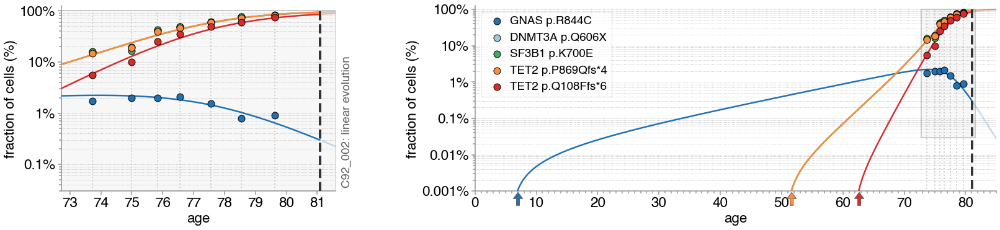

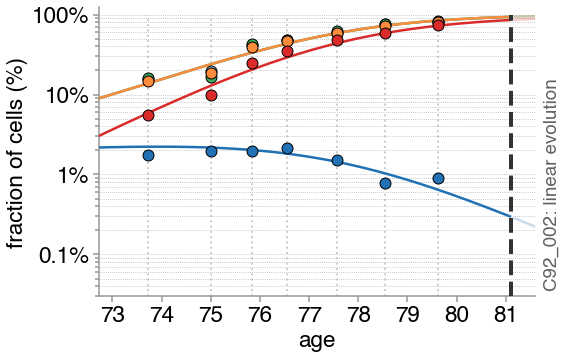

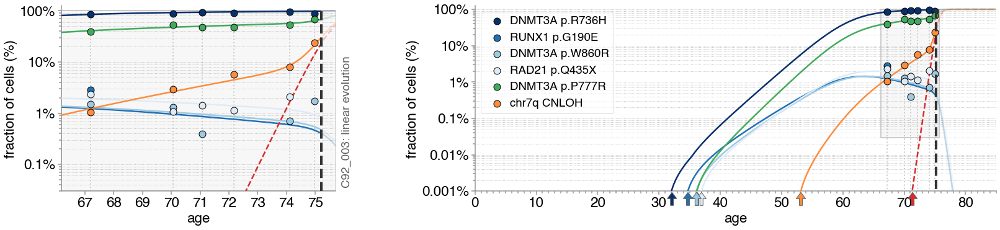

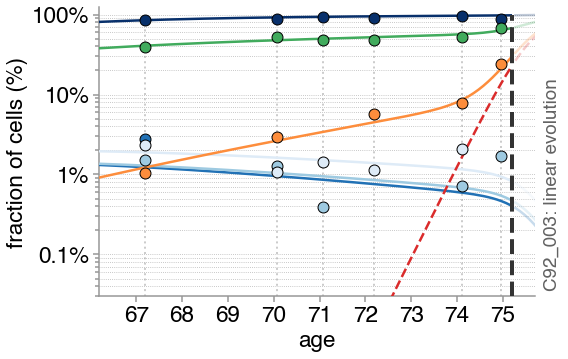

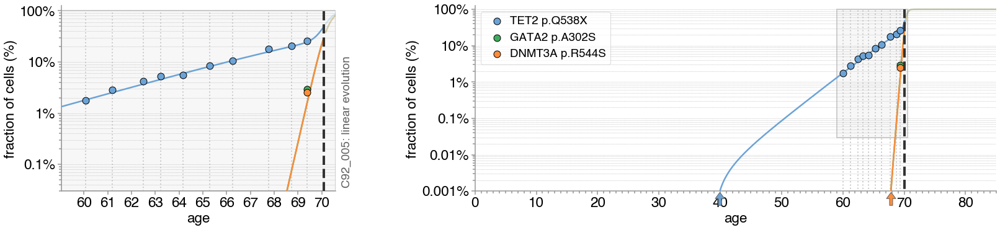

...

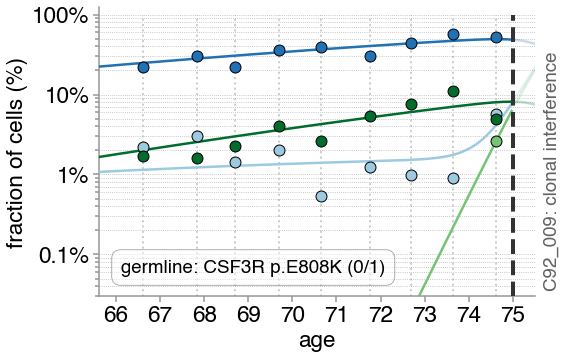

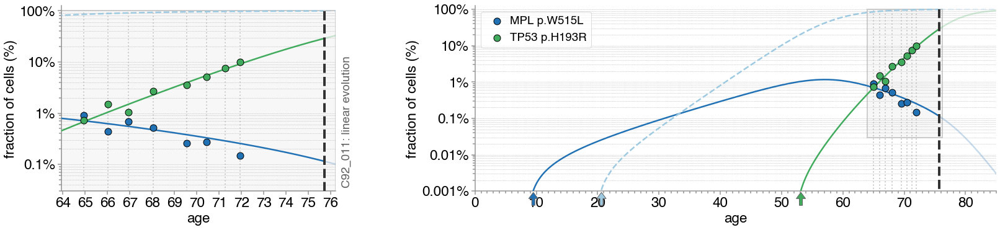

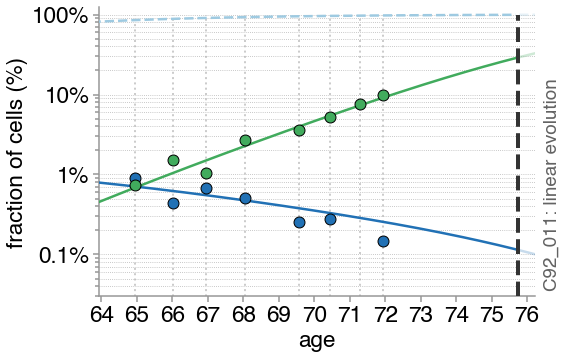

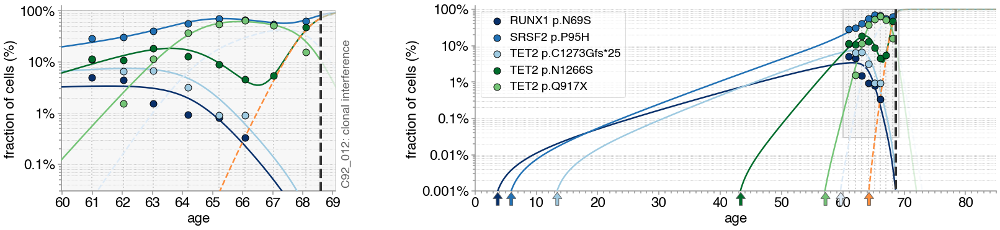

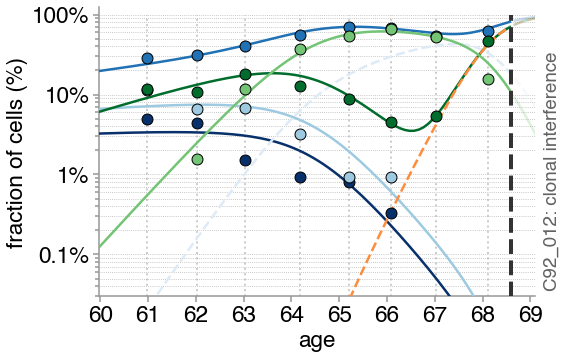

C92_015 data not available


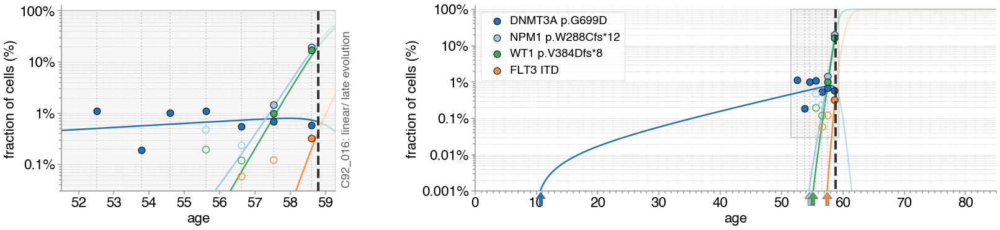

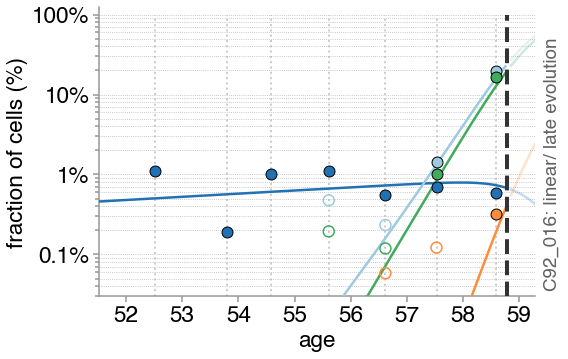

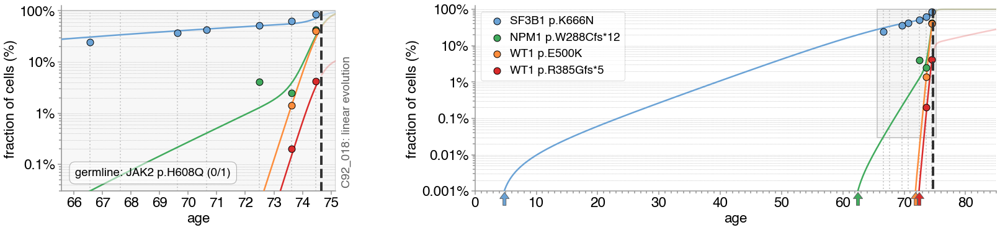

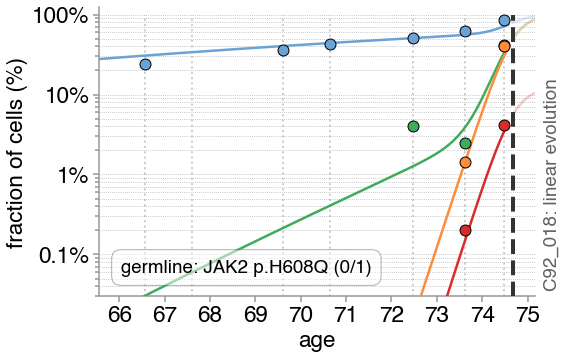

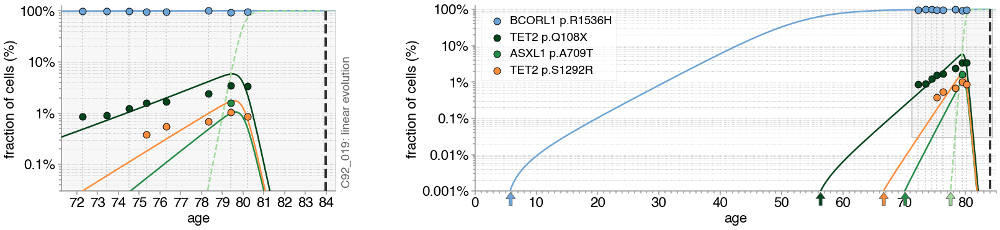

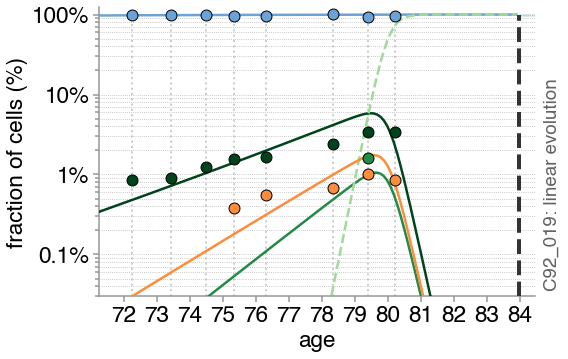

C92_022 data not available


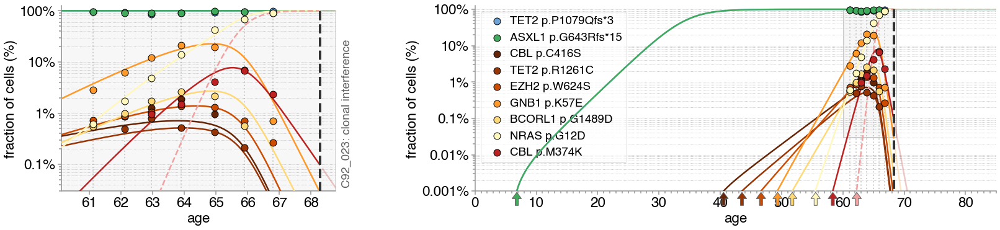

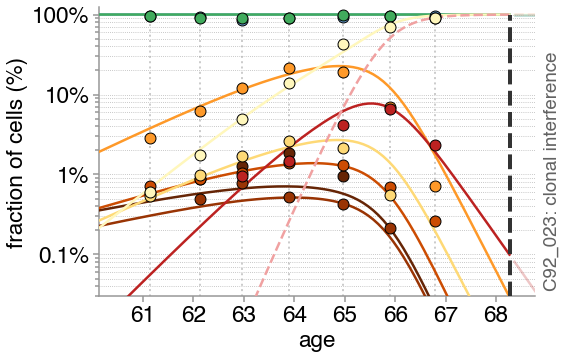

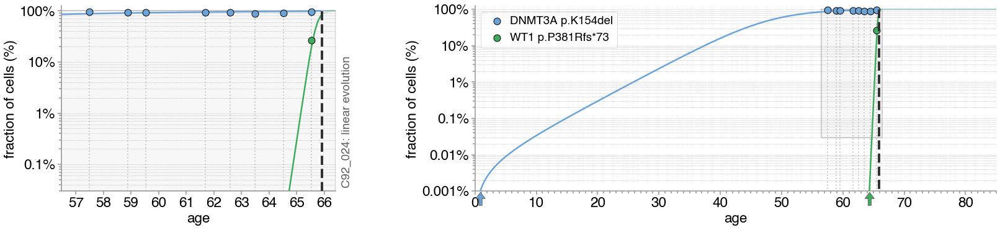

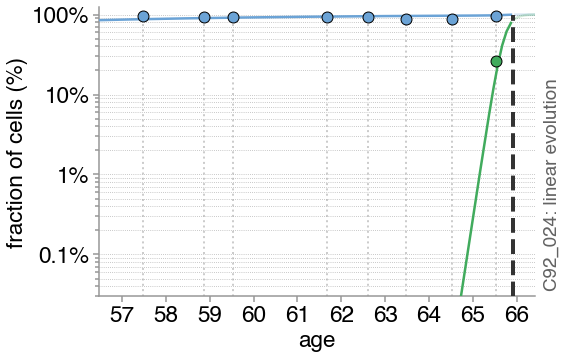

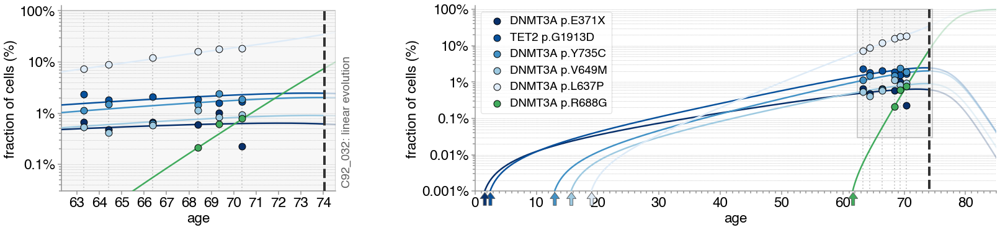

...

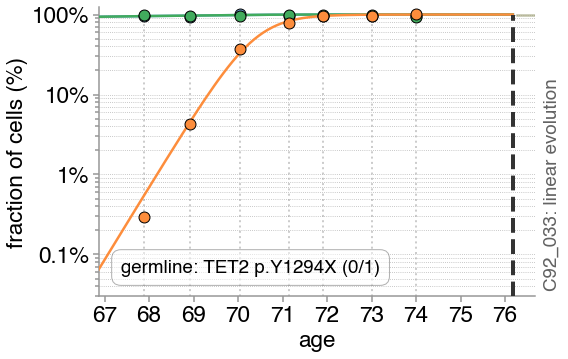

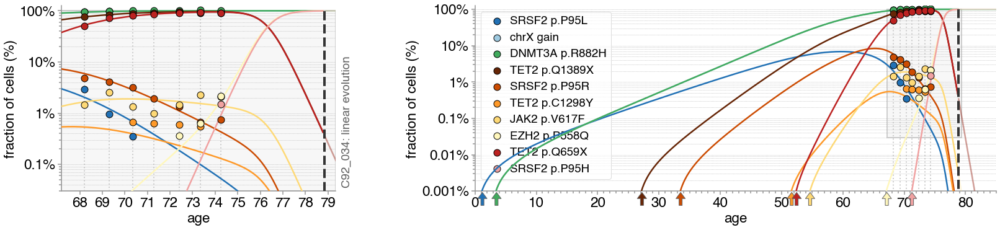

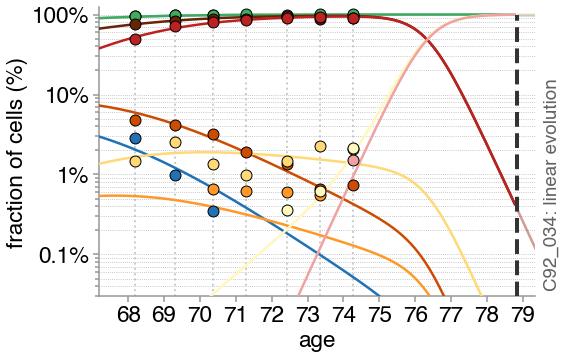

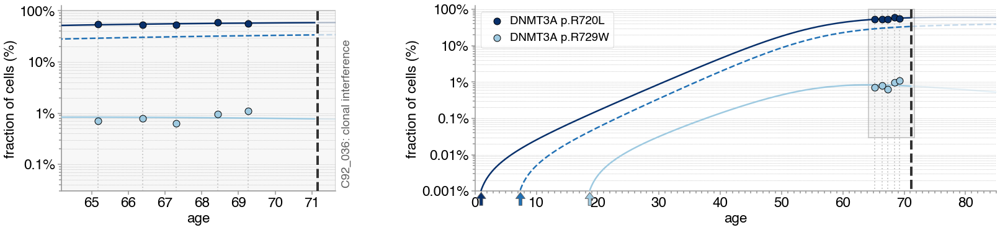

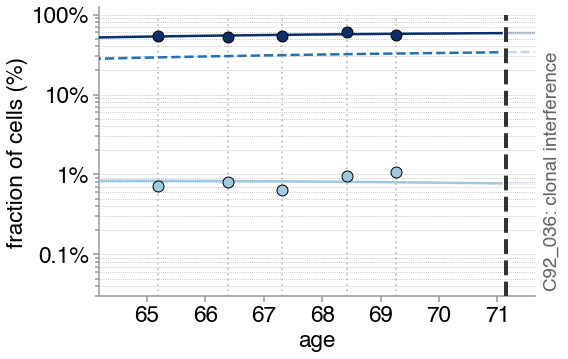

C92_039 data not available


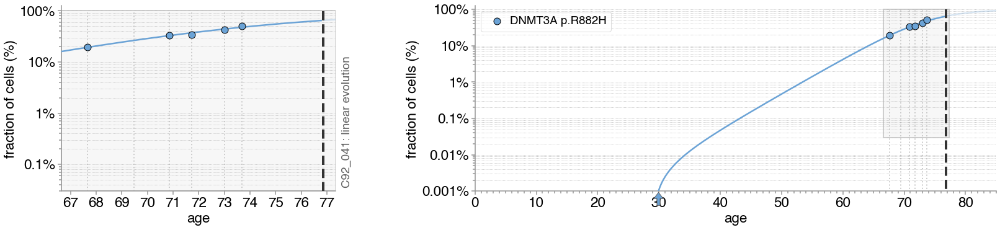

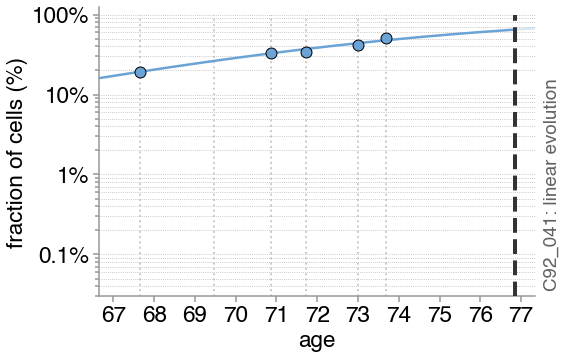

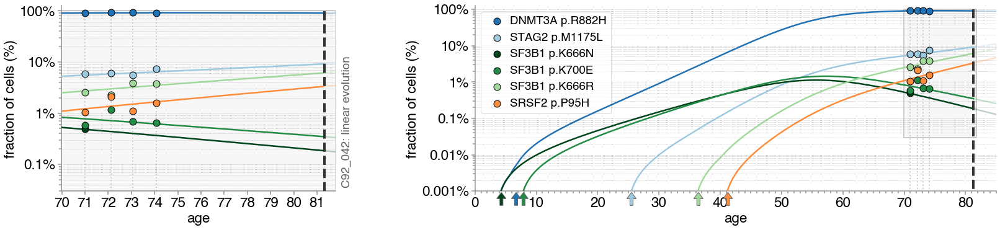

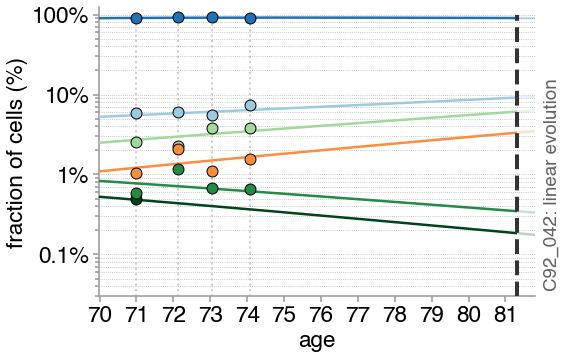

C92_043 data not available
C92_044 data not available


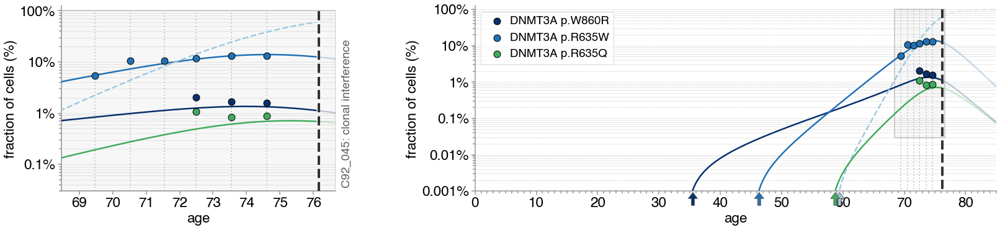

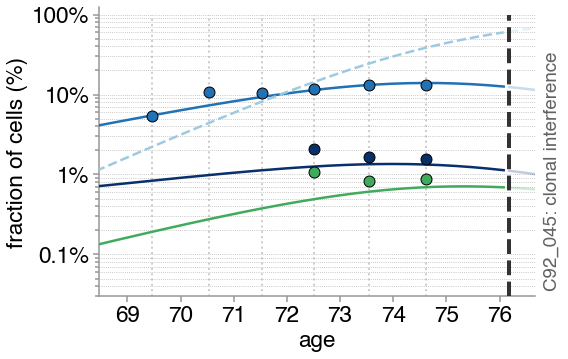

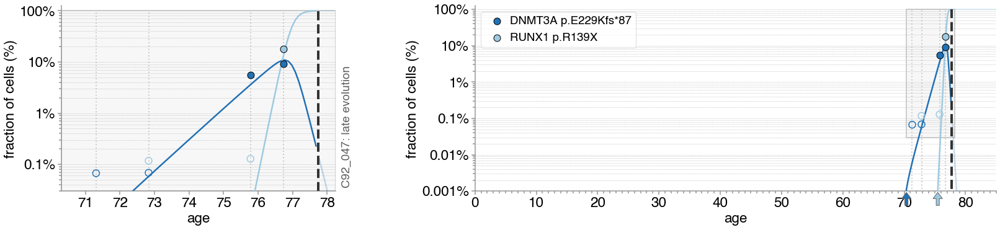

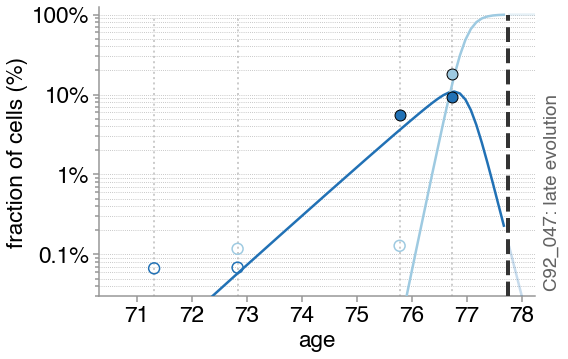

C92_048 data not available


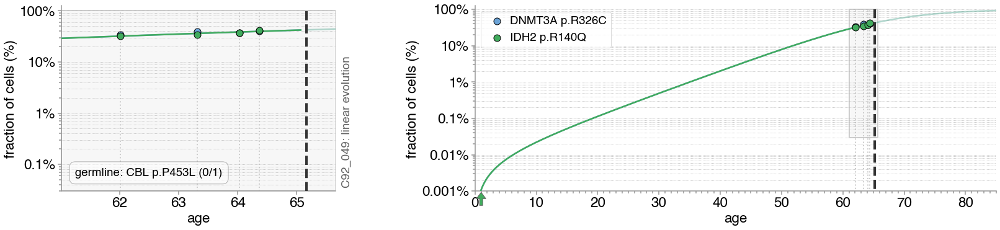

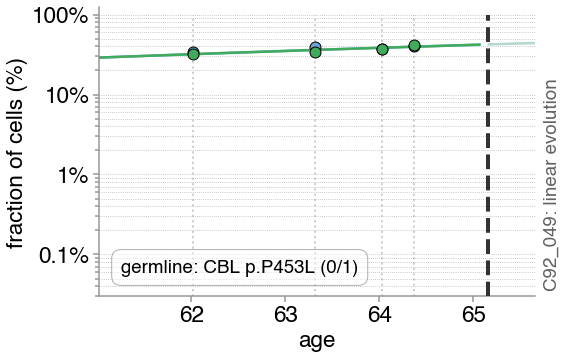

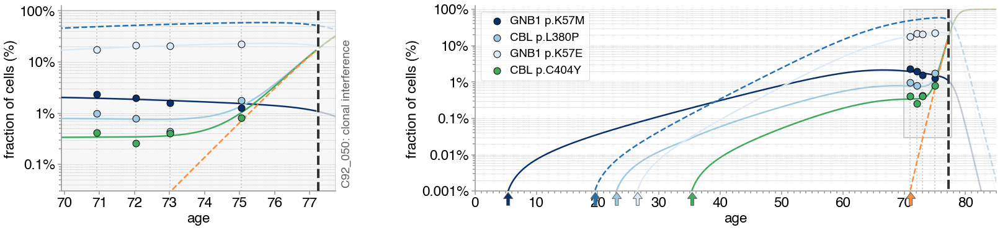

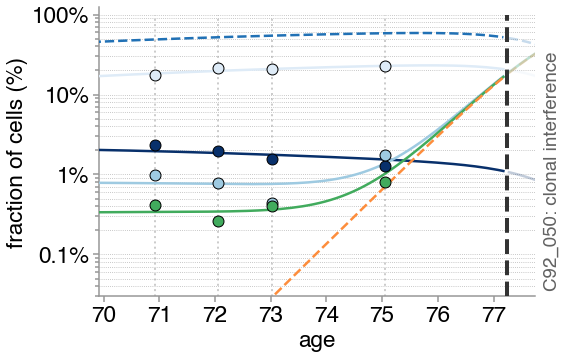

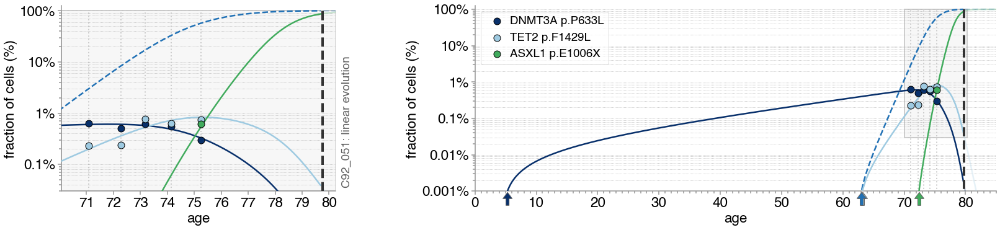

...

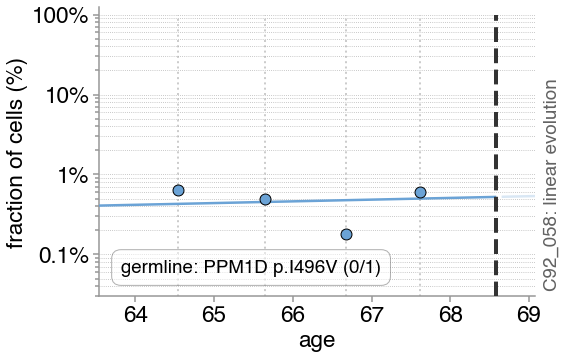

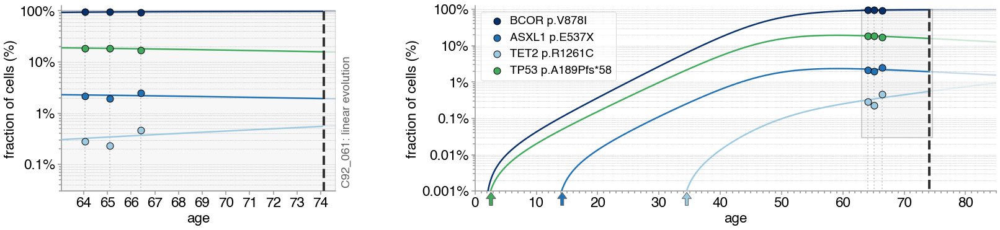

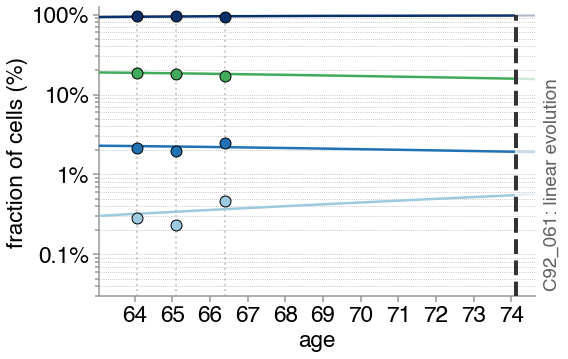

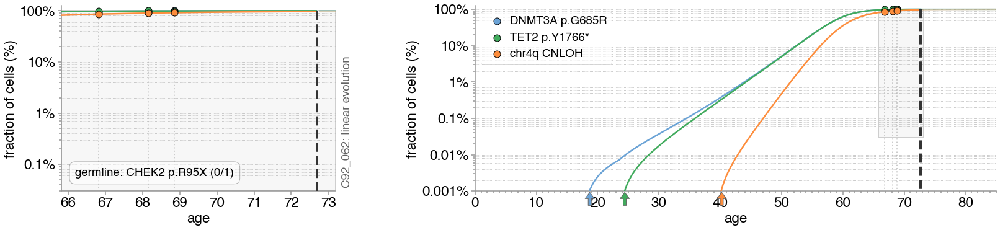

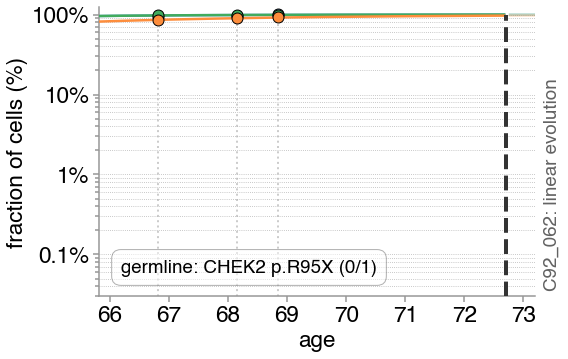

C92_063 data not available


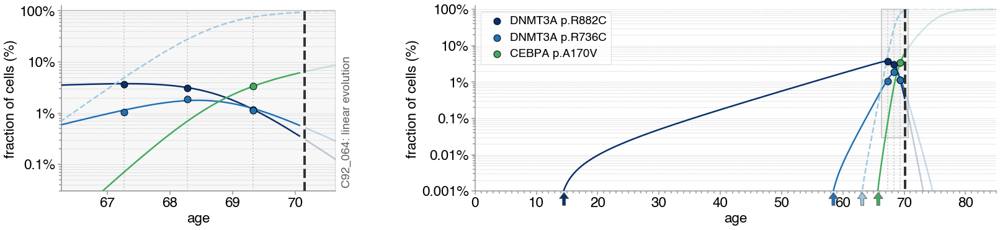

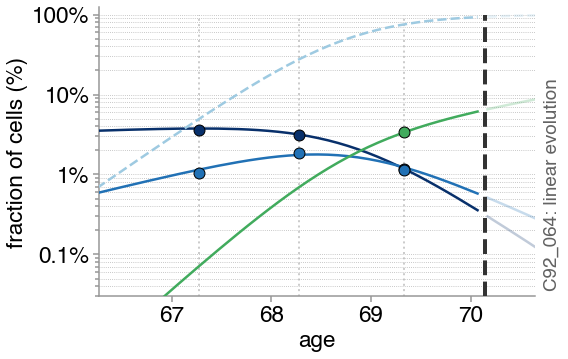

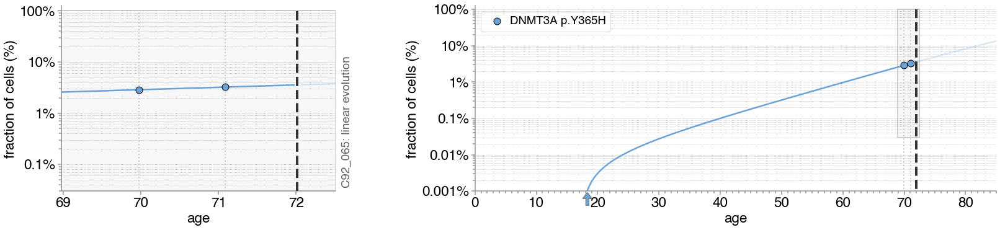

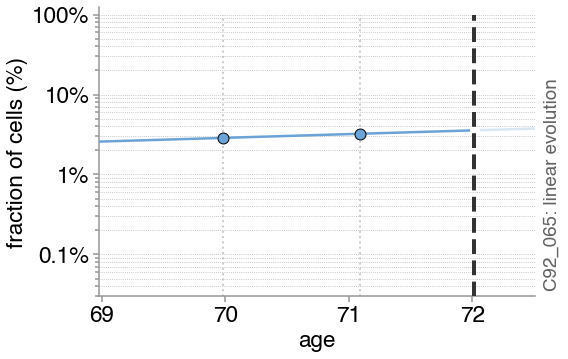

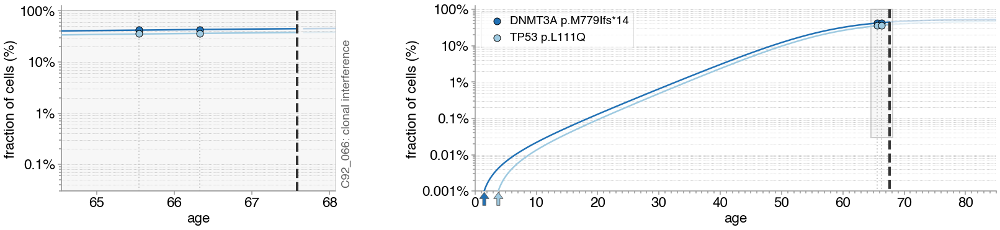

...

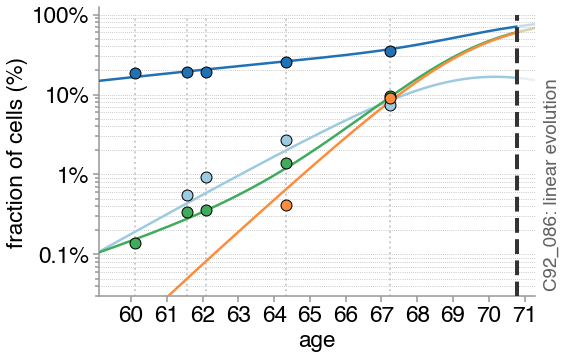

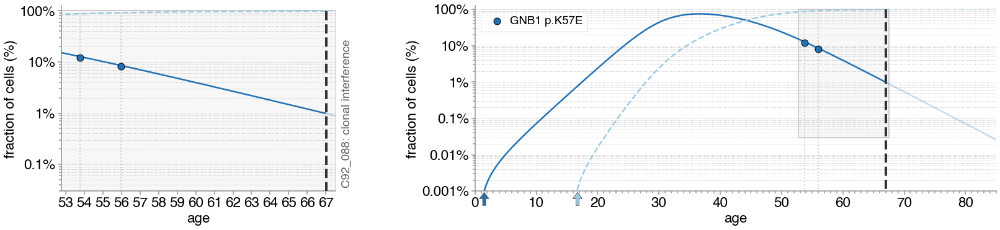

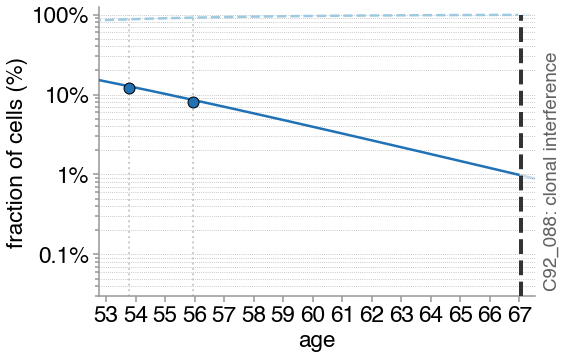

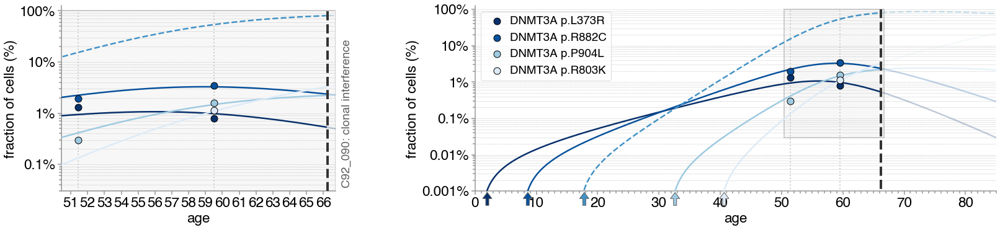

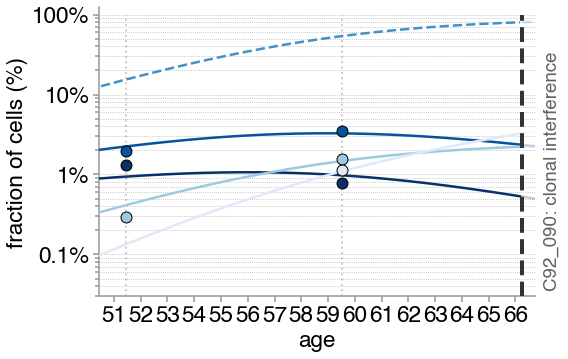

In [81]:
for sample_name in cases:
    sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age = dictionary_sample_details(sample_name)
    sample_variants, variant_details =  sample_trajectories(sample_name, df)
    bounded_sample_variants, all_trajectories_with_bounded = create_bounded_variant_trajectories(sample_name, sample_variants, variant_details)
    try:
        optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
        plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
        plot_trajectories_cell_fractions_just_zoomed_in(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
    except KeyError:
        print(sample_name+' data not available')

## Controls

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

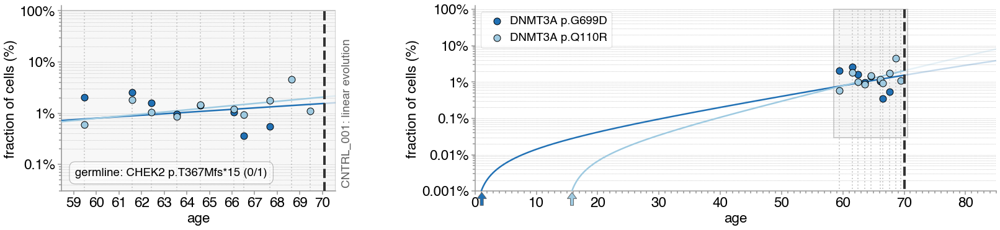

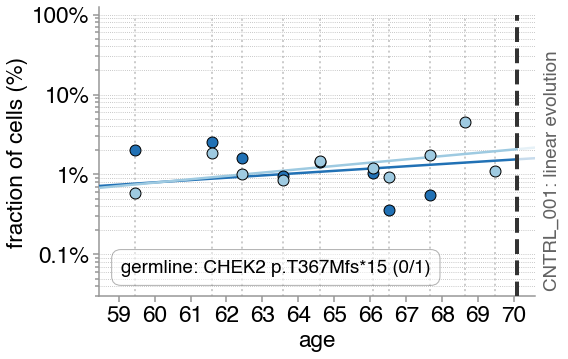

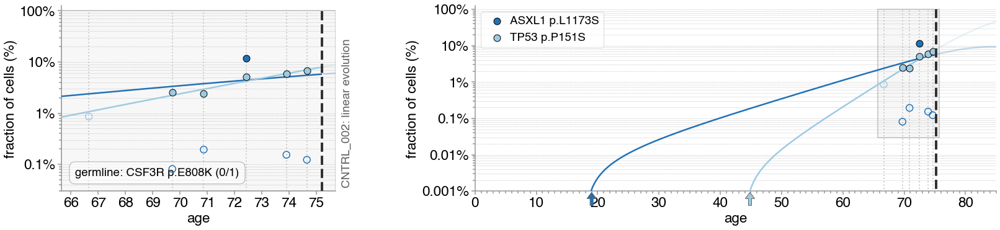

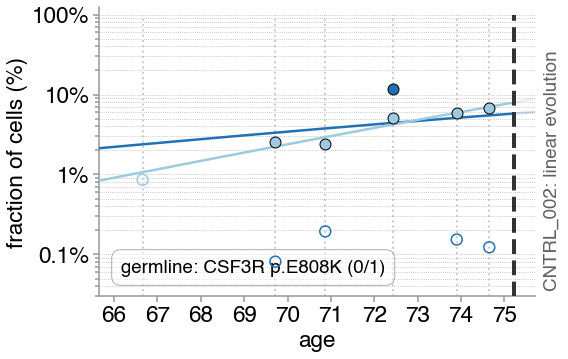

CNTRL_003 data not available


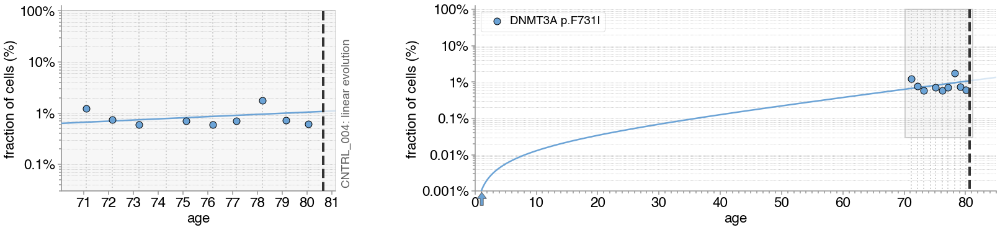

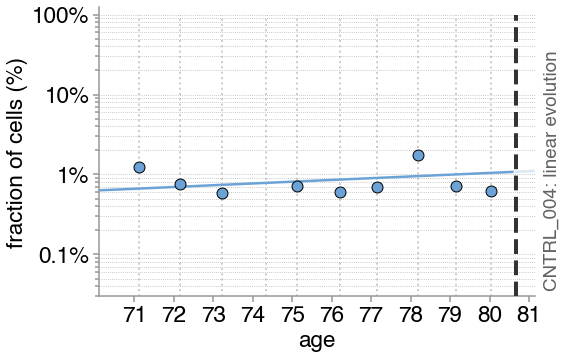

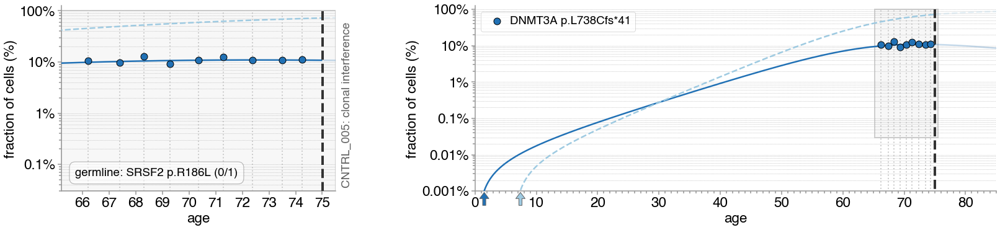

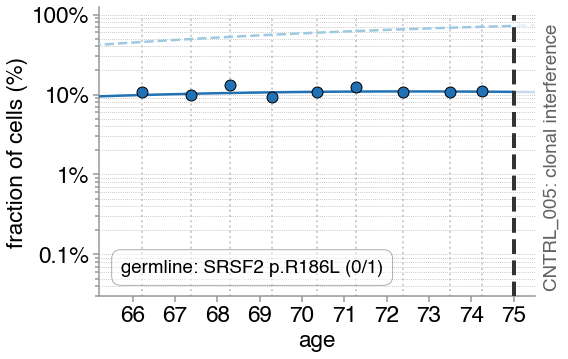

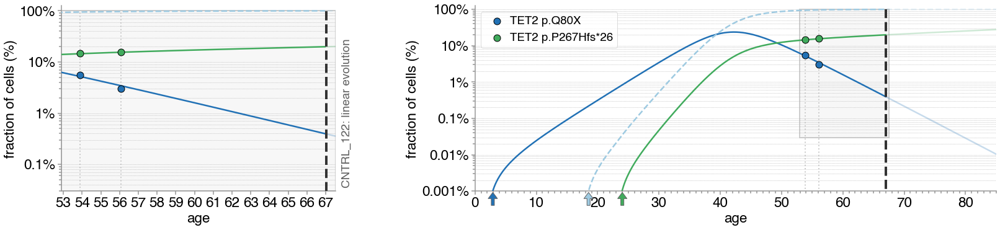

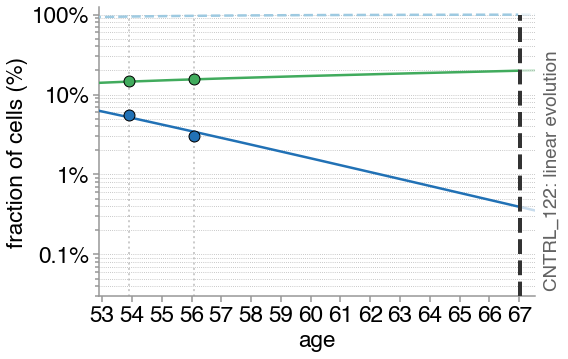

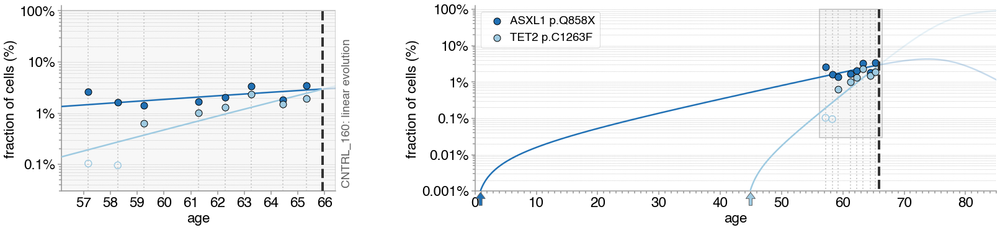

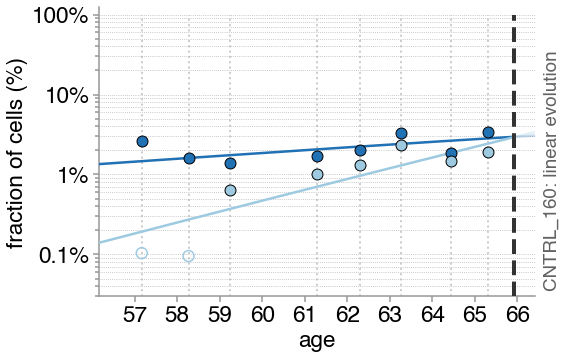

CNTRL_161 data not available


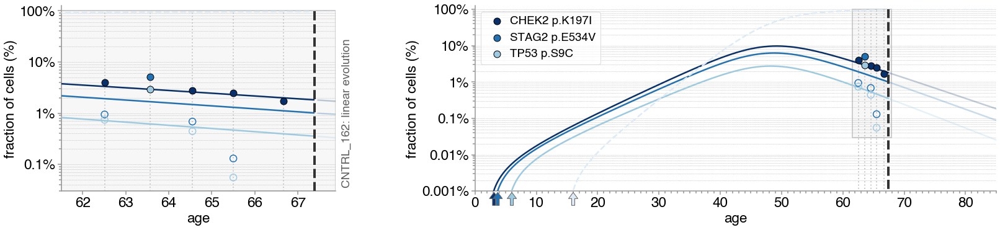

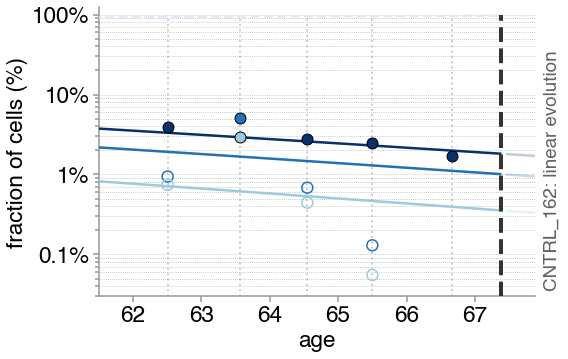

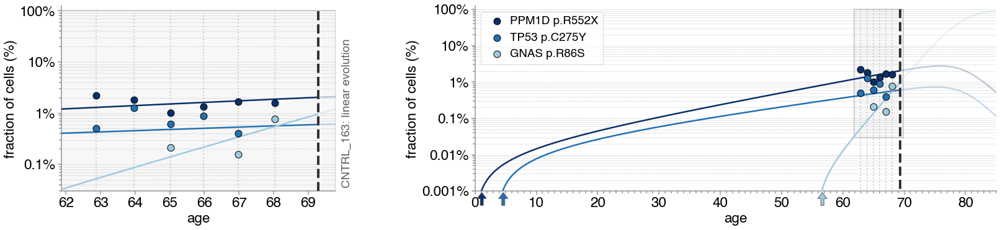

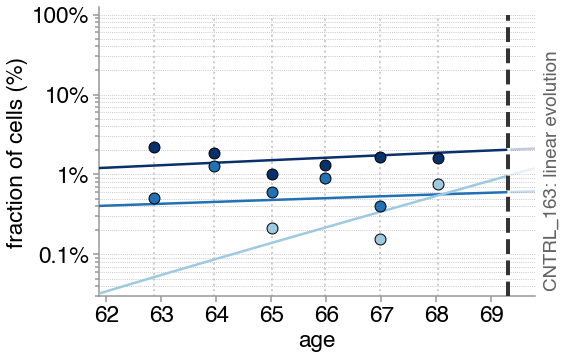

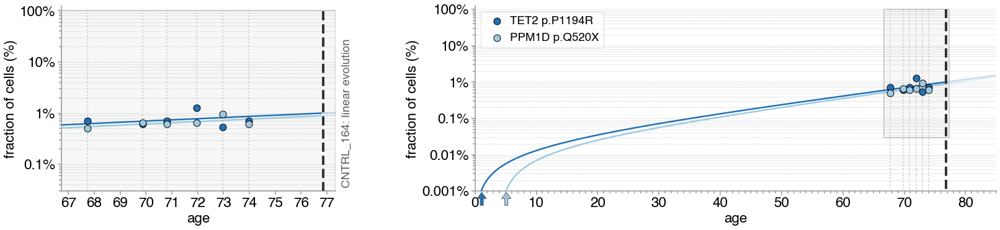

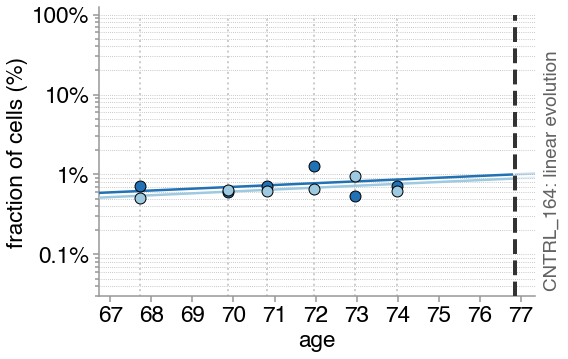

CNTRL_165 data not available


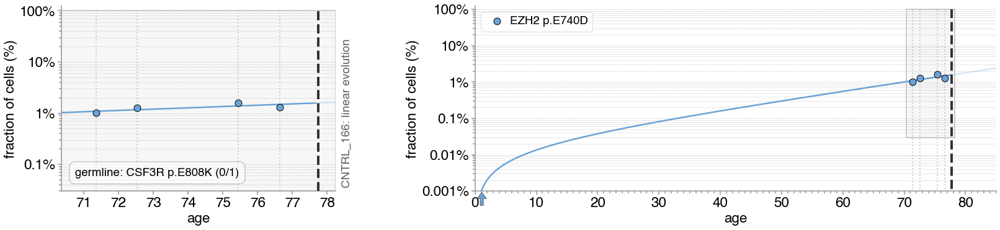

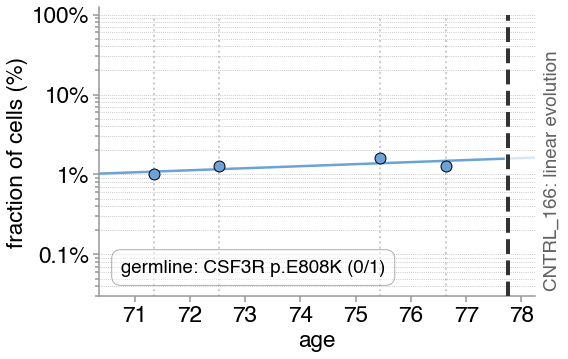

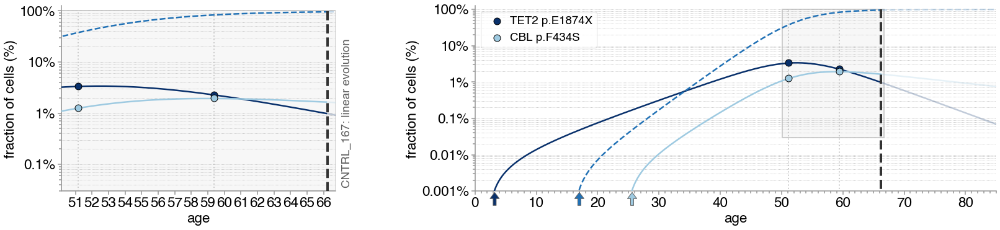

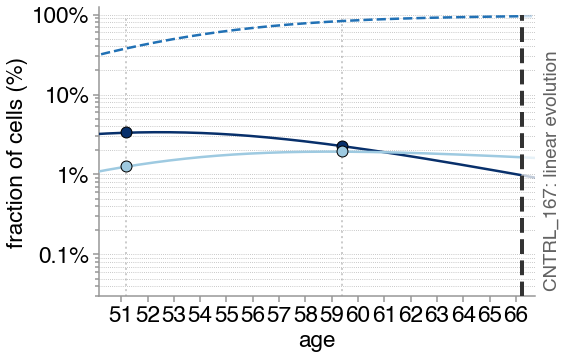

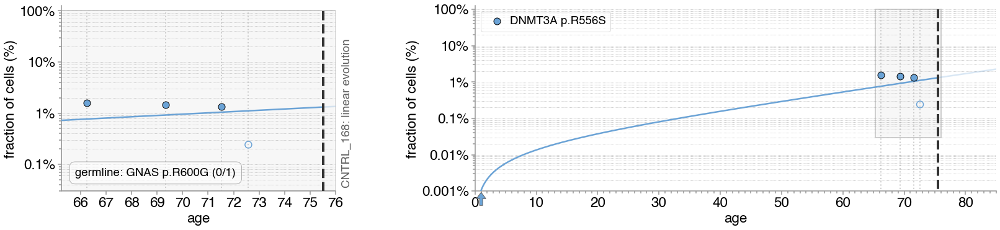

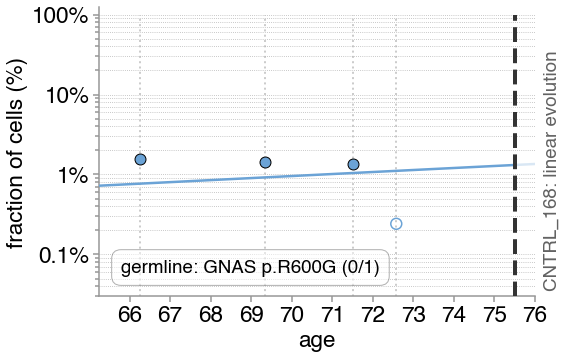

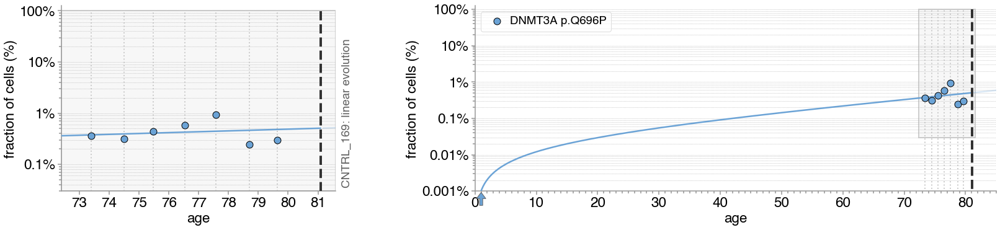

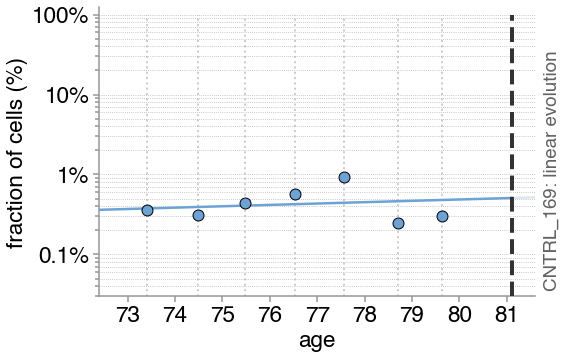

CNTRL_170 data not available
CNTRL_171 data not available


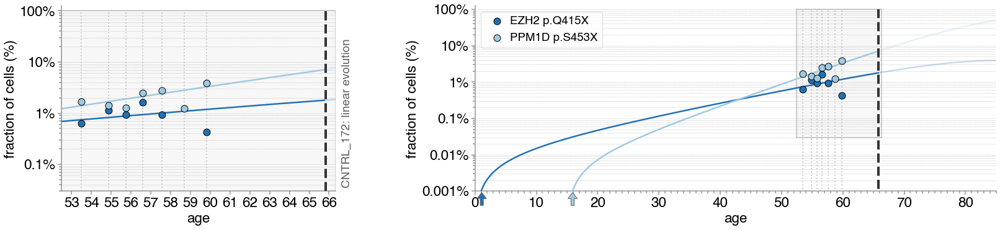

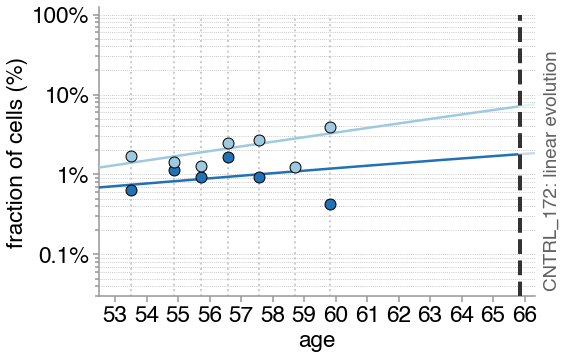

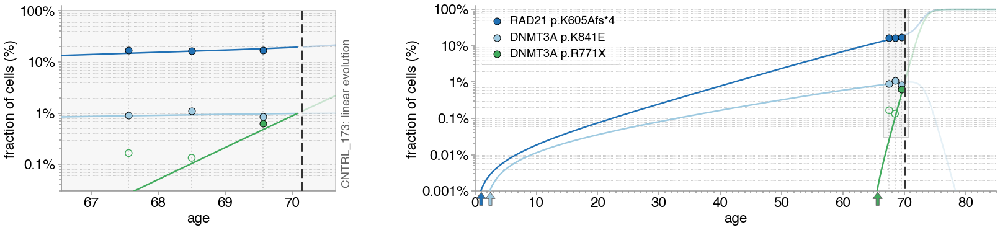

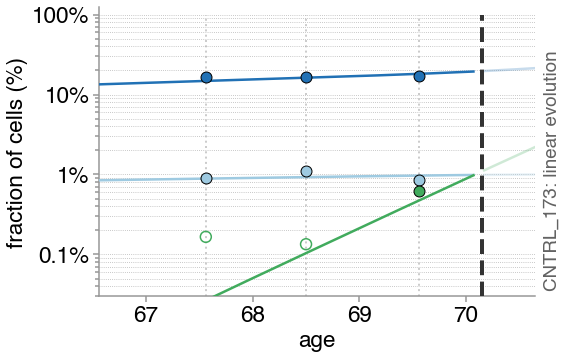

CNTRL_174 data not available


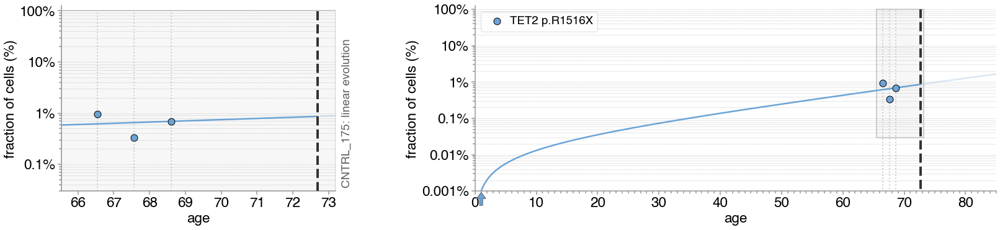

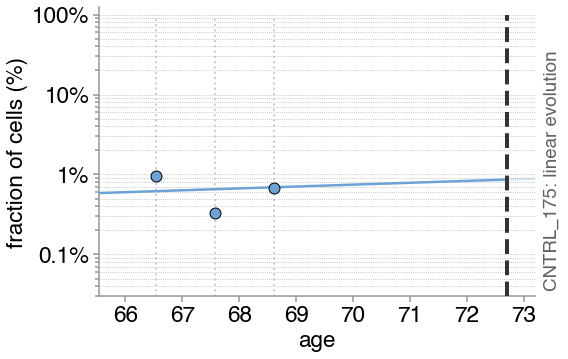

CNTRL_177 data not available


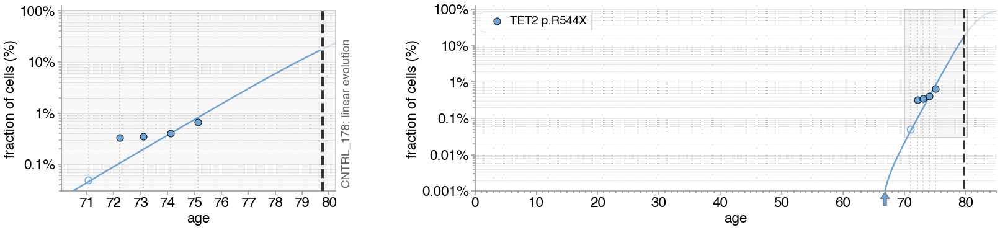

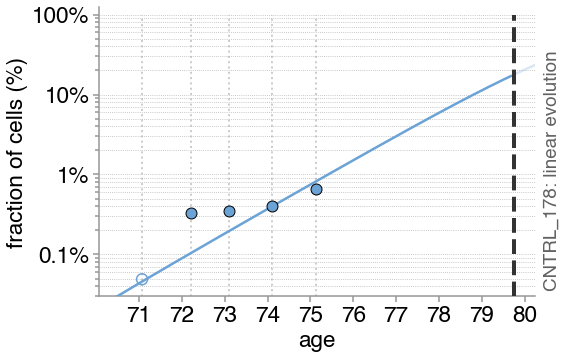

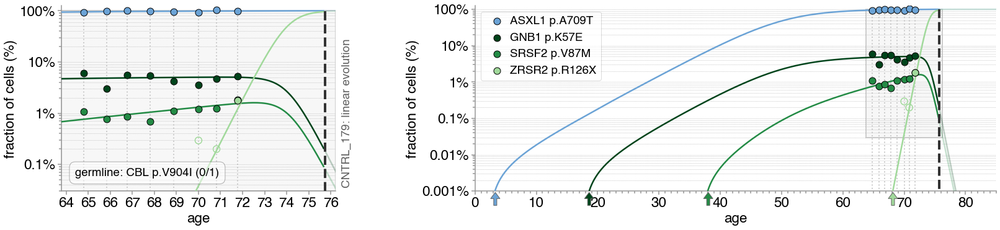

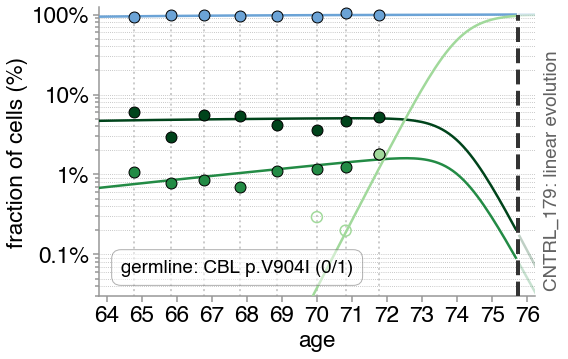

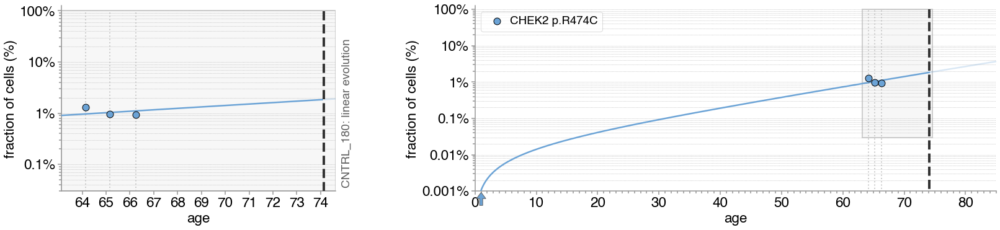

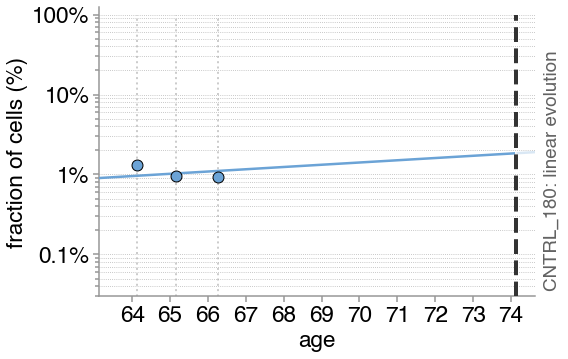

CNTRL_181 data not available


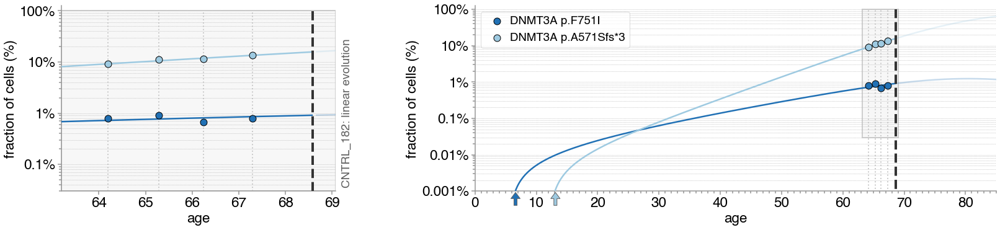

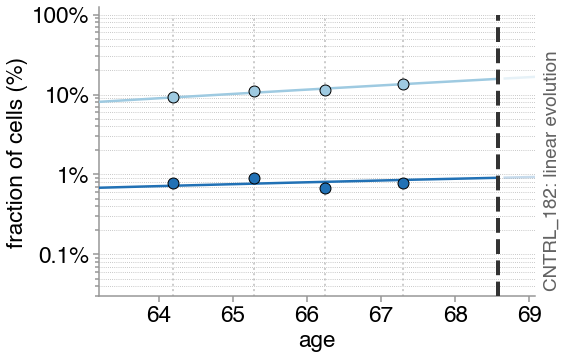

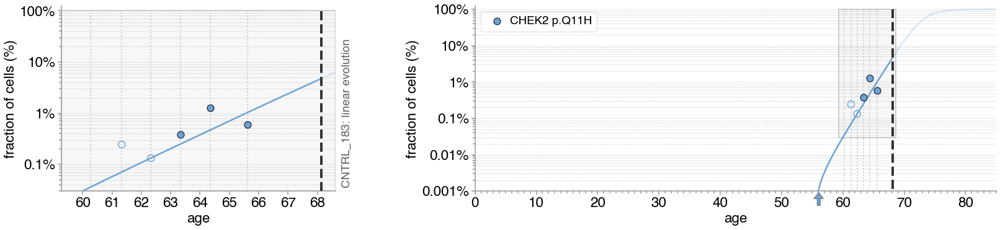

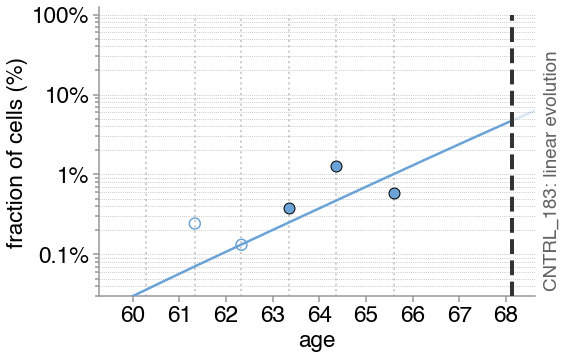

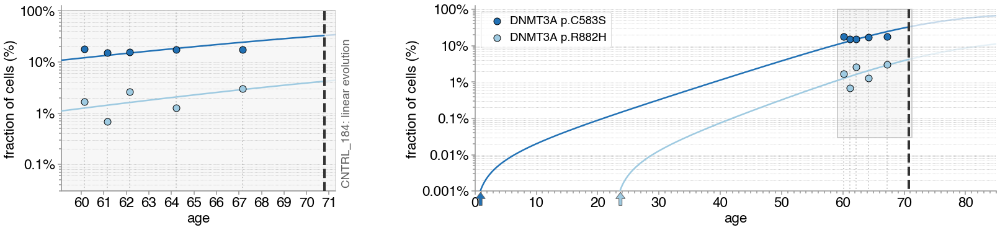

...

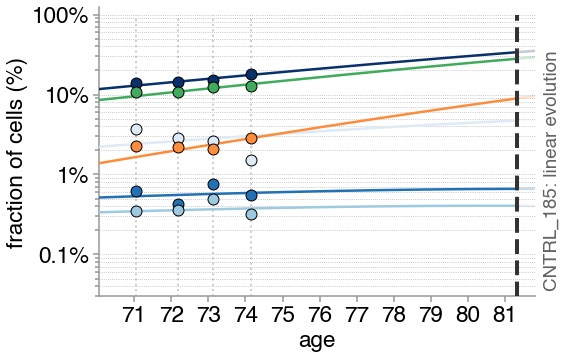

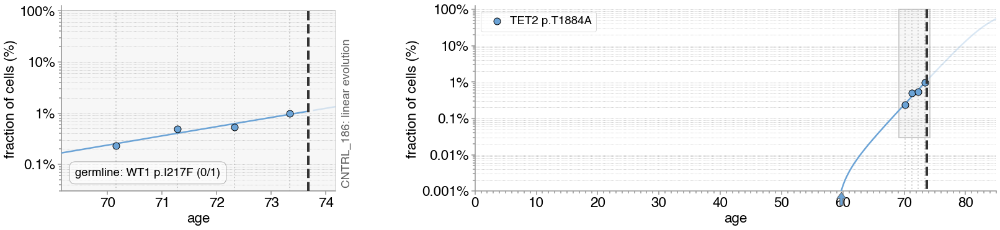

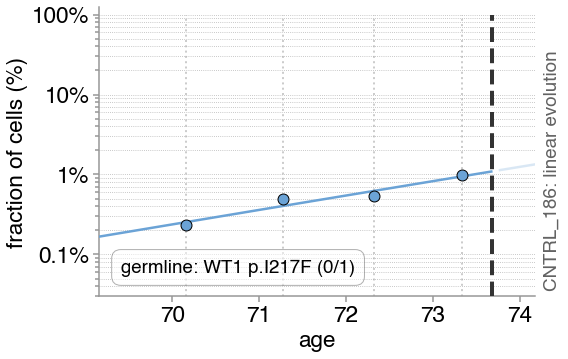

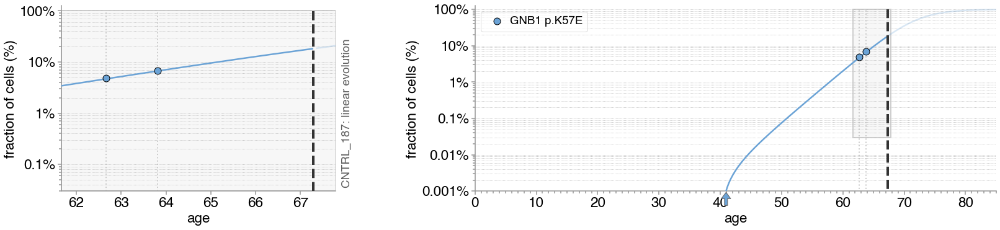

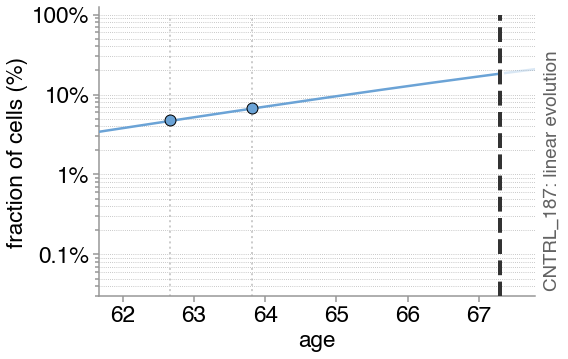

CNTRL_188 data not available
CNTRL_189 data not available


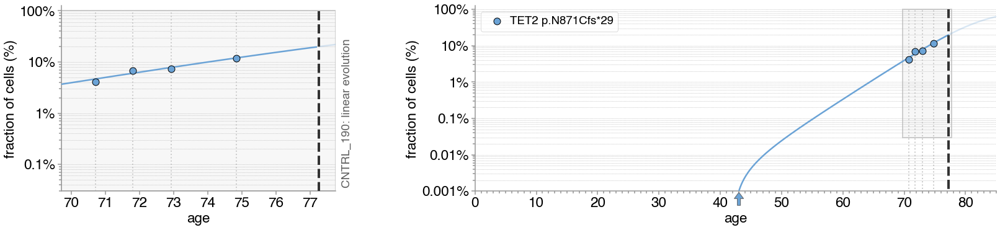

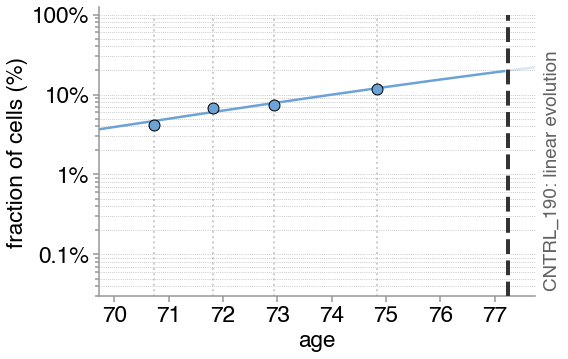

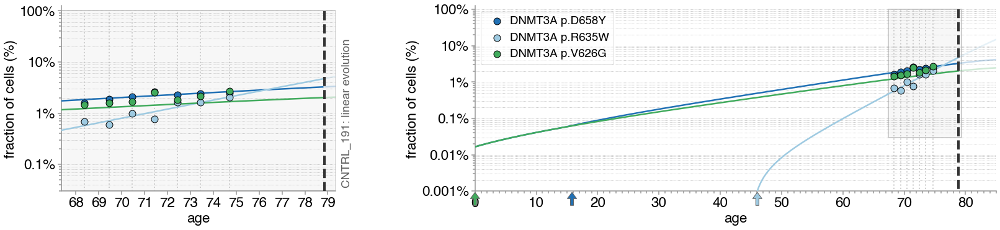

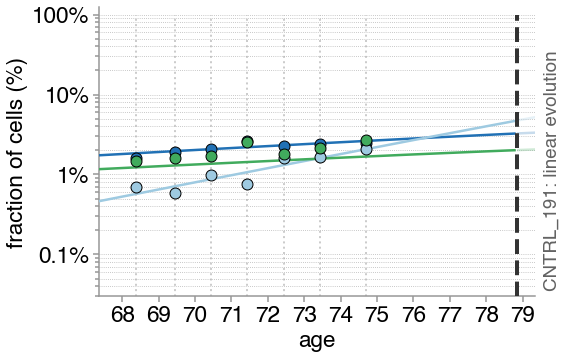

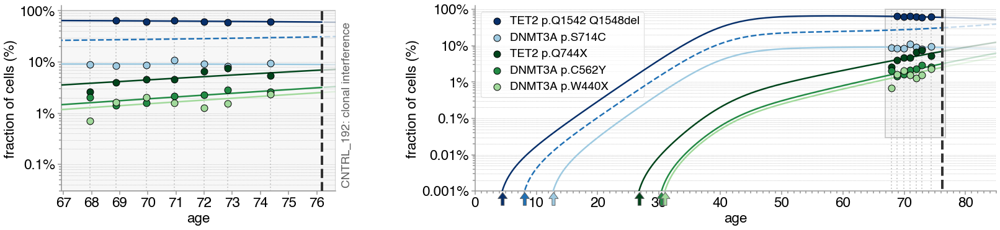

...

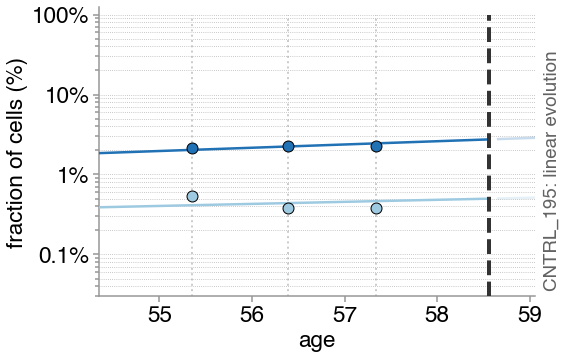

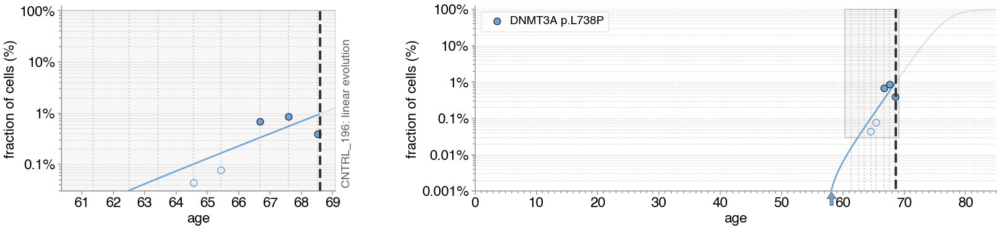

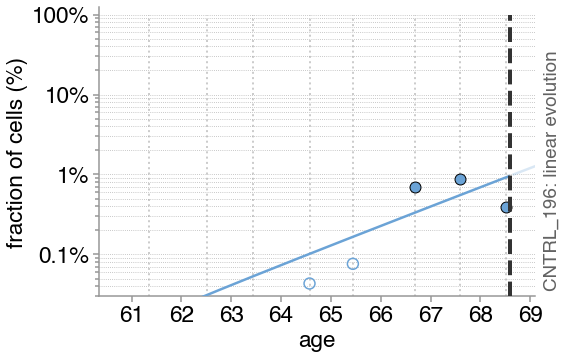

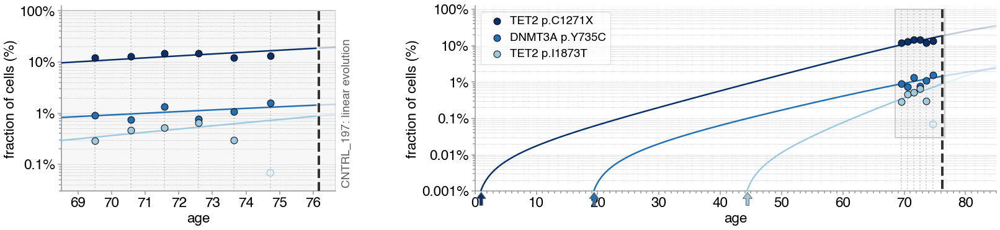

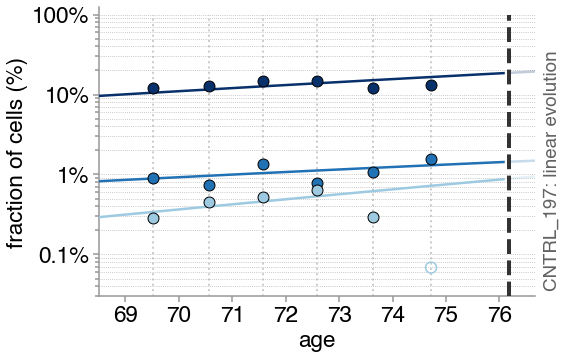

CNTRL_198 data not available


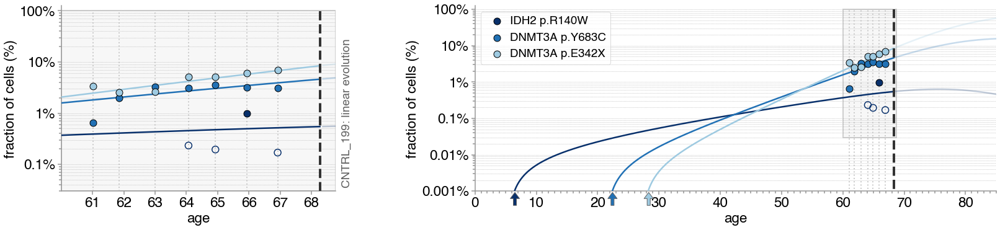

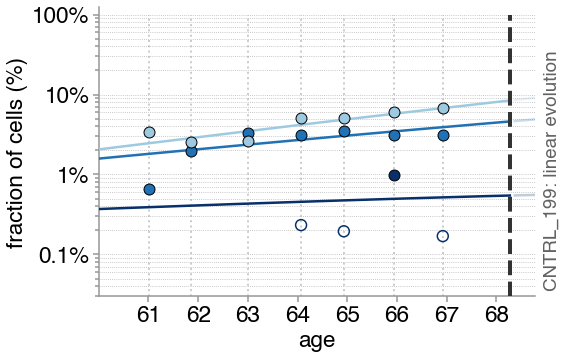

CNTRL_200 data not available


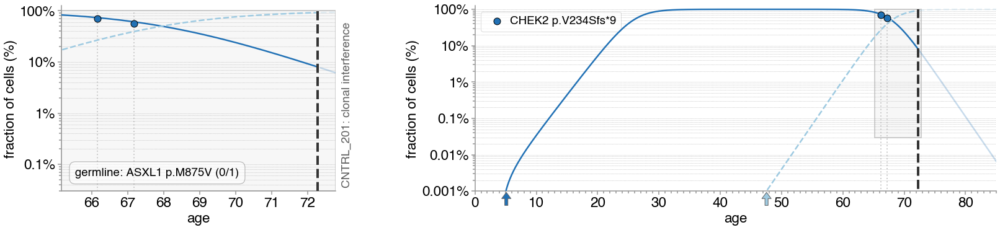

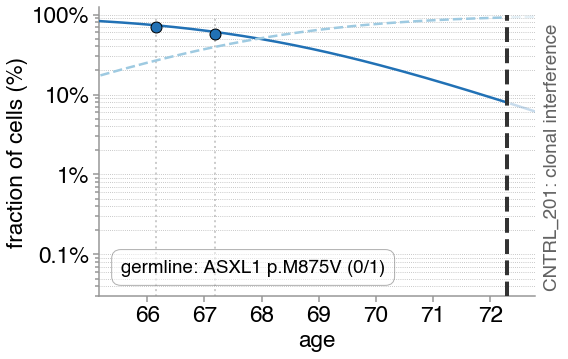

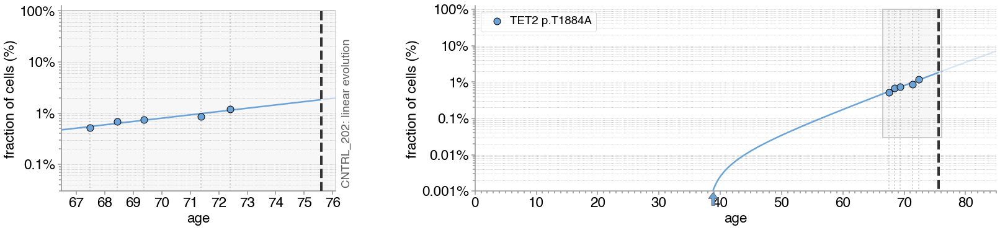

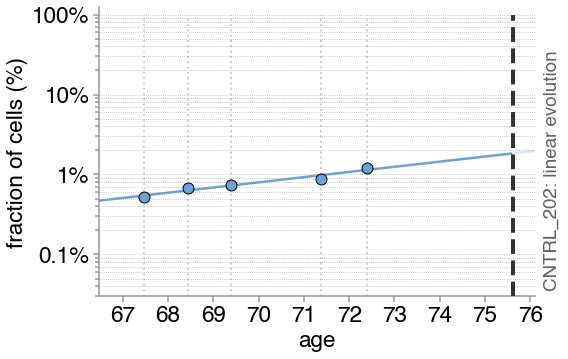

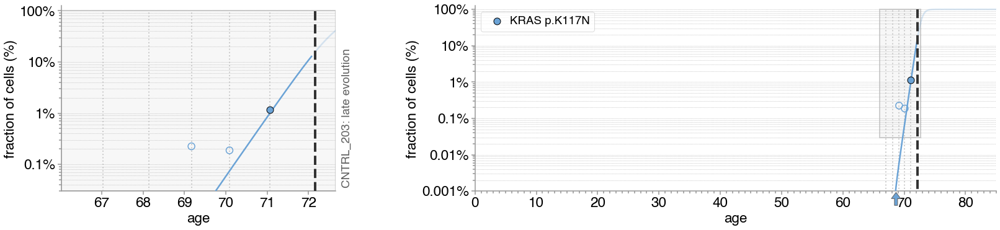

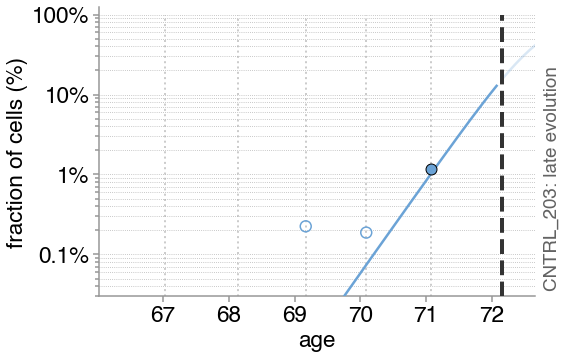

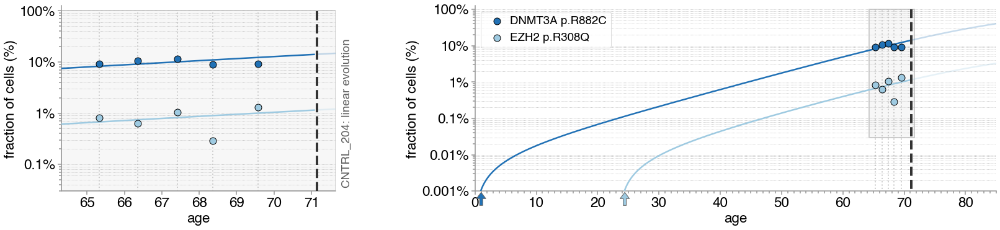

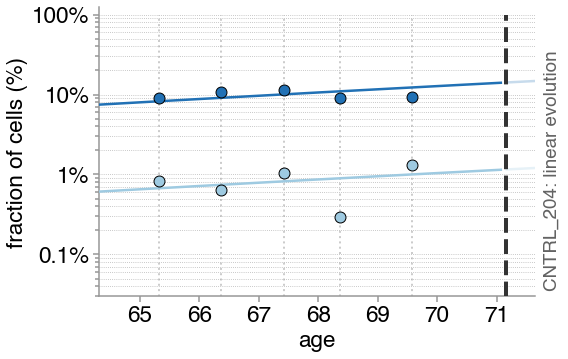

In [82]:
for sample_name in controls:
    sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age = dictionary_sample_details(sample_name)
    sample_variants, variant_details =  sample_trajectories(sample_name, df)
    bounded_sample_variants, all_trajectories_with_bounded = create_bounded_variant_trajectories(sample_name, sample_variants, variant_details)
    try:
        optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
        plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
        plot_trajectories_cell_fractions_just_zoomed_in(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
    except KeyError:
        print(sample_name+' data not available')

## C92_022 (manually optimised)

In [84]:
def import_variant_and_clone_colours(sample_name):
    df = pd.read_csv("Data_files/Optimiser_results_v14.txt", sep = '\t')
    df_sample = df[df['Sample_name']==sample_name]
    df_sample['Variant_colors'] = df_sample['Variant_colors'].apply(ast.literal_eval)
    df_sample['Clone_colors'] = df_sample['Clone_colors'].apply(ast.literal_eval)
    df_sample = df_sample[['Sample_name', 'Variant_colors', 'Clone_colors']]
    df_sample = df_sample.set_index('Sample_name')
    df_sample_dict = pd.DataFrame.to_dict(df_sample, orient = 'index')
    
    return df_sample_dict[sample_name]['Variant_colors'], df_sample_dict[sample_name]['Clone_colors']

In [87]:
def clonal_structure_list(manual_clones):
    
    clones_list = []

    for k, v in manual_clones.items():
        clones_list.append(k)

    return clones_list

In [91]:
def get_effective_depths_for_variant_each_timepoint(sample_name, ages_dict_names, clonal_structure, variant_details):

    depths_by_timepoint = {}
    variants_looked_at = []

    for clone in clonal_structure:
        for variant in clone:
            if variant not in variants_looked_at:
                if (variant not in ['X', 'Y', 'Z']) and ('chr' not in variant): #not an mCA or missing driver
                    chromosome = variant_details[variant][0]
                    position = variant_details[variant][1]

                    for age, sample_timepoint in ages_dict_names.items():
                        #retrieve depth
                        if variant != 'FLT3_ITD':
                            try:
                                df= pd.read_csv('Data_files/VCF_files/DCS/'+sample_timepoint+'_SNV_SNV_watson_code_DCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
                            except FileNotFoundError:
                                df= pd.read_csv('Data_files/VCF_files/DCS/'+sample_timepoint+'_SNV_watson_code_DCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
                        else: #if FLT3-ITD, look at the SSCS depth...
                            try:
                                df= pd.read_csv('Data_files/VCF_files/SSCS/'+sample_timepoint+'_SNV_SNV_watson_code_SSCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])
                            except FileNotFoundError:
                                df= pd.read_csv('Data_files/VCF_files/SSCS/'+sample_timepoint+'_SNV_watson_code_SSCS_variants_MUFs_3_all_positions.vcf', comment = '#', sep = '\t', header = None, names = ['chromosome', 'position', 'ID', 'REF','ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT', 'SAMPLE'])

                        df = df[(df['chromosome']==chromosome) & (df['position']==position)]
                        df['depth'] = df['INFO'].apply(extract_depth)
                        total_depth = df['depth'].tolist()[0]

                        if variant in depths_by_timepoint.keys():
                            depths_by_timepoint[variant][age]=total_depth
                        else:
                            depths_by_timepoint[variant]={age: total_depth}
                else:
                    for age, sample_timepoint in ages_dict_names.items():
                        if variant in depths_by_timepoint.keys():
                            depths_by_timepoint[variant][age]=1800
                        else:
                            depths_by_timepoint[variant]={age: 1800}
                variants_looked_at.append(variant)

    return depths_by_timepoint

In [92]:
def add_establishment_time_to_dict(clones, T, dt):
    
    for k, v in clones.items():
        s=v['fitness']
        tau=v['est_time']
        clone_size_trajectory=np.array([(1/s)*((np.exp(s*(i*dt-tau)))-1) for i in range(T)])
        clone_size_trajectory=np.where(clone_size_trajectory < 0, 0.0, clone_size_trajectory)
        v['clone_size_trajectory']=clone_size_trajectory #adds clone_size_trajectory to the clones dictionary

    total_clone_size=np.array([1.0*10**5 for i in range(T)]) #N = 10**5
    for k, v in clones.items():
        clone_size_trajectory=v['clone_size_trajectory']
        total_clone_size+=clone_size_trajectory

    for k, v in clones.items():
        clone_size_trajectory=v['clone_size_trajectory']
        clone_frequency_trajectory=clone_size_trajectory/total_clone_size
        v['clone_frequency_trajectory']=clone_frequency_trajectory #taking in to account changing N size (from other clones)

        for age, freq in zip(np.linspace(0, T*dt, T), clone_frequency_trajectory):
            if freq >= 1/(1.0*10**5):
                establishment_age = age
                break
        v['establishment_time']=establishment_age
        
    return clones

In [106]:
#Calculate the likelihood score..
def log_binomial(n, k):
    return loggamma(n + 1) - loggamma(k + 1) - loggamma(n - k + 1)

def log_prob_binomial(n, k, p):
    try:
        result = log_binomial(n, k) + k * math.log(p) + (n - k) * math.log(1 - p)
    except ValueError:
        print('ValueError in log_prob_binomial function')
        result = -100000
    return result

def calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age):
    #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
    likelihood = 0
    for kk, vv in observed_traj.items(): #kk = age, vv = variant frequency
        if vv != 'not processed':
            observed_freq=float(vv)
            if 0<observed_freq<upper_freq: #only allow variants between a certain freq, e.g. <40% to contribute to likelihood
                timestep=round(kk*10)
                predicted_freq=pred_traj[timestep]
                effective_depth = variant_depths_by_age[mut][kk]
                n_eff=round(effective_depth*observed_freq)
                loglikelihood=-1.0*log_prob_binomial(effective_depth, n_eff, predicted_freq)
                likelihood+=loglikelihood

    return likelihood

def inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age):
    likelihood = 0
    for non_detected_timepoint in inferred_timepoints:
        non_detected_inferred_VAF = bounded_variant_dict[mut][non_detected_timepoint]
        #take in to account the non-detected timepoint - making sure it doesn't infer a trajectory the has VAFs that should have been detectable when they weren't
        observed_non_detected_freq=float(non_detected_inferred_VAF) #maximum frequency it could be (otherwise would have been detected))
        timestep=round(non_detected_timepoint*10)
        predicted_non_detected_freq=pred_traj[timestep]
        effective_depth = variant_depths_by_age[mut][non_detected_timepoint]
        n_eff=round(effective_depth*observed_non_detected_freq)
        if predicted_non_detected_freq > observed_non_detected_freq: #add penalty if trying to fit trajectory higher than non-detected VAF
            # print('predicted freq is in range it should have bene detected -> assign high likelihood')
            loglikelihood=-1.0*log_prob_binomial(effective_depth, n_eff, predicted_non_detected_freq)
            likelihood+=3*loglikelihood #penalise the loglikelihood if predicted >bounded VAF

    return likelihood

def likelihood_optimised_clones(sample_name, clones, T, dt, bounded_variant_dict, variant_dict, sample_ages_lists, upper_freq, diagnosis_age, variant_depths_by_age): #upper_freq = upper VAF (or cell fraction) to allow the likelihood to include
    #e.g. clones={('DNMT3A_p.Q606X'):{'fitness':0.67, 'est_time':60}, ('DNMT3A_p.Q606X', 'SF3B1_p.K700E'):{'fitness':0.67, 'est_time':62.}}
    #e.g. variant_dict={'SF3B1_p.K700E': {73.73: 0.0801915020945541, 75.0: 0.0819563780568407, 75.83: 0.2144559173947577}, 'DNMT3A_p.Q606X': {73.73: 0.0774505849132714 etc...
    #e.g. bounded_variant_dict = variant_dict but just for the variants with inferred bounded VAFs

#     print('sample name = ', sample_name)
    sample_timings = sample_ages_lists[sample_name]
#     print('sample timings = ', sample_timings)
    # print('diagnosis age = ', diagnosis_age)

    mutation_trajectories={}
    for k, v in clones.items():
        clone_frequency_trajectory=v['clone_frequency_trajectory']

        if 'JAK2_p.V617F' in k:
            if 'chr9p_CNLOH' in k: #i.e. if clone with both JAK2 V617F and 9p CNLOH in
                for mutation in k:
                    if mutation == 'JAK2_p.V617F':
                        if mutation in mutation_trajectories:
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                    else:
                        if mutation in mutation_trajectories:
                            if mutation[0:3]=='chr': #i.e. if = mCA
                                mutation_trajectories[mutation]+=clone_frequency_trajectory
                            else:
                                mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                        else: #if mutation not in mutation_trajectories
                            if mutation[0:3]=='chr': #i.e. if = mCA
                                mutation_trajectories[mutation]=clone_frequency_trajectory
                            else:
                                mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

            else: #i.e. clone with JAK2 V617F, but no 9p CNLOH
                for mutation in k:
                    if mutation in mutation_trajectories:
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                    else: #if mutation not in mutation_trajectories
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

        elif 'chr4q_CNLOH' in k:
            for mutation in k:
                if 'TET2' in mutation:
#                     print('chr4 CNLOH + TET2 mutation')
                    if mutation in mutation_trajectories:
                        mutation_trajectories[mutation]+=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]=clone_frequency_trajectory
                else:
                    if mutation in mutation_trajectories:
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                    else: #if mutation not in mutation_trajectories
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

        else:
            for mutation in k:
                if mutation in mutation_trajectories:
                    if mutation[0:3]=='chr': #i.e. if = mCA
                        mutation_trajectories[mutation]+=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                else: #if mutation not in mutation_trajectories
                    if mutation[0:3]=='chr': #i.e. if = mCA
                        mutation_trajectories[mutation]=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

#     print('mutation trajectories keys = ', mutation_trajectories.keys())

    variant_likelihoods=[]
    total_likelihood=0.0
    for mut, pred_traj in mutation_trajectories.items(): #mut = each variant present (as apposed to clones)
        variant_likelihood=0.0

        if mut in variant_dict: #i.e. not an unseen driver this allows for unseen mutations to influence trajectories of others
            observed_traj=variant_dict[mut]

            if mut in bounded_variant_dict: #i.e. if it is a mutation that either appears late or disappears early...
                detected_timepoints = list(variant_dict[mut].keys()) #ages it was detected

                #if only detected in final timepoint, make sure it's fitness is higher than its predecessor clone (if it has one)
                if len(detected_timepoints)==1:
                    if detected_timepoints[0]==sample_timings[-1]: #i.e.final timepoint
                        clone_final_variant_detected=0
                        for k, v in clones.items():
                            if k[-1]==mut: #if the last variant in the clone is the variant of interest, e.g. CBL
                                clone_final_variant_detected+=1
                                current_clone_fitness = v['fitness'] #of e.g. (TET2, TET2, SRSF2, CBL) clone
                                current_clone_est_time = v['est_time']
                                current_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
                                full_clone = k
                                if len(full_clone)==1: #variant with only 1 timepoint is a single mutant clone
                                    if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0): #penalise the optimiser if it tries to fit an est_time older than the diagnosis age
                                        variant_likelihood+=10000
                                    else:
                                        timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys())
                                        inferred_timepoints = []
                                        for timepoint in timepoints_in_bounded_dict:
                                            if timepoint not in detected_timepoints:
                                                inferred_timepoints.append(timepoint)

                                        #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                                        variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                                        #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                                        variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

                                if len(full_clone)>1: #i.e. variant with only 1 timepoint is not a single mutant clone
                                    variant_of_interest = 0
                                    preceding_clone_final_variant = k[-2] #e.g. if clone = (TET2, TET2, SRSF2, CBL) clone, preceding clone final variant is SRSF2
                                    for k, v in clones.items():
                                        if k[-1]==preceding_clone_final_variant: #i.e. found the predecessor clone (e.g. TET2, TET2, SRSF2)
                                            # print('predecessor clone = ', k)
                                            variant_of_interest+=1
                                            predecessor_clone_fitness = v['fitness']
                                            predecessor_clone_est_time = v['est_time']
                                            predecessor_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
                                            # print('predecessor clone fitness = ', predecessor_clone_fitness)
                                            if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0) or (current_clone_fitness < predecessor_clone_fitness) or (current_clone_est_time < predecessor_clone_est_time):
                                                variant_likelihood+=10000
                                            else: #if estimated establishment time and fitness is feasible...
                                                timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys()) #timepoints where variant was not dtected
                                                inferred_timepoints = []
                                                for timepoint in timepoints_in_bounded_dict:
                                                    if timepoint not in detected_timepoints:
                                                        inferred_timepoints.append(timepoint)

                                                #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                                                variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                                                #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                                                variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

                                    if variant_of_interest == 0: #i.e. not found predecessor clone which has the penultimate variant as its final variant
                                    #e.g. predecessor of DNMT3A, GATA2, ASXL1 is GATA2, but there is no clone ending in GATA2, only e.g. (DNMT3A)
                                        if len(full_clone)>2:
                                            preceding_clone_final_variant = k[-3] #if 2 mutations were added at once to latest clone, try seeing if can find predecessor clone
                                            for k, v in clones.items():
                                                if k[-1]==preceding_clone_final_variant: #if found predecessor clone
                                                    variant_of_interest+=1
                                                    predecessor_clone_fitness = v['fitness']
                                                    predecessor_clone_est_time = v['est_time']
                                                    predecessor_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
                                                    # print('predecessor clone fitness = ', predecessor_clone_fitness)
                                                    if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0) or (current_clone_fitness < predecessor_clone_fitness) or (current_clone_est_time < predecessor_clone_est_time):
                                                        variant_likelihood+=10000
                                                    else: #if estimated establishment time is not <0 or after time of diagnosis...
                                                        timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys())
                                                        inferred_timepoints = []
                                                        for timepoint in timepoints_in_bounded_dict:
                                                            if timepoint not in detected_timepoints:
                                                                inferred_timepoints.append(timepoint)

                                                        #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                                                        variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                                                        #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                                                        variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

                    else: #detected at 1 timepoint, but the timepoint it is detected at is not the final timepoint
                        current_clone_est_time = 0
                        for k, v in clones.items():
                            if k[-1]==mut: #if the last variant in the clone is the variant of interest
                                current_clone_est_time = v['est_time']
                                current_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)

                        if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0): #penalise the optimiser if it tries to assign an est_time > diangnosis age
                            # print(str(full_clone)+' clone est_time > diagnosis age -> assign high likelihood')
                            variant_likelihood+=10000

                        else: #if estimated est_time is reasonable, check to make sure the trajectory is not unrealistic given the undetected variants
                            timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys())
                            inferred_timepoints = []
                            for timepoint in timepoints_in_bounded_dict:
                                if timepoint not in detected_timepoints:
                                    inferred_timepoints.append(timepoint)

                            #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                            variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                            #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                            for kk, vv in observed_traj.items(): #kk = age, vv = variant frequency
                                if vv != 'not processed':
                                    observed_freq=float(vv)
                                    if 0.0<observed_freq<upper_freq: #only allow variants between a certain freq, e.g. <40% to contribute to likelihood
                                        timestep=round(kk*10)
                                        predicted_freq=pred_traj[timestep]
                                        effective_depth = variant_depths_by_age[mut][kk]
                                        n_eff=round(effective_depth*observed_freq)
                                        loglikelihood=-1.0*log_prob_binomial(effective_depth, n_eff, predicted_freq)
                                        if len(inferred_timepoints)>=2: #i.e. if there are 2 or more undetected timepoints, but only 1 detected, don't let the undetected pull it below the detected VAF
                                            if predicted_freq<observed_freq:
                                                variant_likelihood+=9*loglikelihood #penalise the loglikelihood if predicted < observed (i.e. penalise more than the penalty for the trajectory being above the non-observed timepoints)
                                            else:
                                                variant_likelihood+=loglikelihood
                                        else: #if only 1 timepoint not observed
                                            if predicted_freq<observed_freq:
                                                variant_likelihood+=3*loglikelihood #penalise the loglikelihood if predicted < observed (i.e. penalise more than the penalty for the trajectory being above the non-observed timepoints)
                                            else:
                                                variant_likelihood+=loglikelihood

                #detected at more than 1 timepoint, but either appears late and/ or disappears early (i.e. it is still in bounded variant dict)...
                else:
                    # print('not only detected in final timepoint, but has some missing timepoints')
                    current_clone_est_time = 0 #set to 0 to cover in case there isn't a clone present with the mutation as it's final variant (e.g. if only present in triple mutant clone)
                    clone_final_variant_detected = 0
                    for k, v in clones.items():
                        if k[-1]==mut: #if the last variant in the clone is the variant of interest
                            clone_final_variant_detected+=1
                            current_clone_fitness = v['fitness']
                            current_clone_est_time = v['est_time']
                            current_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
                            full_clone = k
                            if len(full_clone)==1: #variant with only 1 timepoint is a single mutant clone
                                if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0): #penalise the optimiser if it tries to fit an est_time older than the diagnosis age
                                    variant_likelihood+=10000
                                else:
                                    timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys())
                                    inferred_timepoints = []
                                    for timepoint in timepoints_in_bounded_dict:
                                        if timepoint not in detected_timepoints:
                                            inferred_timepoints.append(timepoint)

                                    #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                                    variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                                    #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                                    variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

                            if len(full_clone)>1: #i.e. variant with only 1 timepoint is not a single mutant clone
                                variant_of_interest = 0
                                preceding_clone_final_variant = k[-2]
                                # print("preceding clone final variant = ", preceding_clone_final_variant)
                                for k, v in clones.items():
                                    if k[-1]==preceding_clone_final_variant:
                                        # print('predecessor clone = ', k)
                                        variant_of_interest+=1
                                        predecessor_clone_fitness = v['fitness']
                                        predecessor_clone_est_time = v['est_time']
                                        predecessor_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
                                        # print('predecessor clone fitness = ', predecessor_clone_fitness)
                                        if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0) or (current_clone_fitness < predecessor_clone_fitness) or (current_clone_est_time < predecessor_clone_est_time):
                                            variant_likelihood+=10000
                                        else: #if estimated establishment time is not <0 or after time of diagnosis...
                                            timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys())
                                            inferred_timepoints = []
                                            for timepoint in timepoints_in_bounded_dict:
                                                if timepoint not in detected_timepoints:
                                                    inferred_timepoints.append(timepoint)

                                            #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                                            variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                                            #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                                            variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

                                if variant_of_interest == 0: #i.e. not found predecessor clone which has the penultimate variant as its final variant
                                #e.g. predecessor of DNMT3A, GATA2, ASXL1 is GATA2, but there is no clone ending in GATA2, only e.g. (DNMT3A)
                                    if len(full_clone)>2:
                                        preceding_clone_final_variant = k[-3] #if 2 mutations were added at once to latest clone, try seeing if can find predecessor clone
                                        for k, v in clones.items():
                                            if k[-1]==preceding_clone_final_variant: #if found predecessor clone
                                                variant_of_interest+=1
                                                predecessor_clone_fitness = v['fitness']
                                                predecessor_clone_est_time = v['est_time']
                                                predecessor_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
                                                # print('predecessor clone fitness = ', predecessor_clone_fitness)
                                                if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0) or (current_clone_fitness < predecessor_clone_fitness) or (current_clone_est_time < predecessor_clone_est_time):
                                                    variant_likelihood+=10000
                                                else: #if estimated establishment time is not <0 or after time of diagnosis...
                                                    timepoints_in_bounded_dict = list(bounded_variant_dict[mut].keys())
                                                    inferred_timepoints = []
                                                    for timepoint in timepoints_in_bounded_dict:
                                                        if timepoint not in detected_timepoints:
                                                            inferred_timepoints.append(timepoint)

                                                    #penalise the likelihood if trying to fit trajectory higher than non-detected VAF
                                                    variant_likelihood += inferred_timepoint_penalisation(mut, inferred_timepoints, bounded_variant_dict, pred_traj, variant_depths_by_age)

                                                    #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                                                    variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

            else: #if variant detected at all timepoints
#                 print('variant is detected at all timepoits')
                current_clone_est_time = 0 #set to 0 to cover in case there isn't a clone present with the mutation as it's final variant (e.g. if only present in triple mutant clone)
                predecessor_clone_est_time = 0 #set to 0 to cover in case there isn't a predecessor clone
                for k, v in clones.items():
                    # print('k in clones = ', k)
                    if k[-1]==mut: #if the last variant in the clone is the variant of interest
                        current_clone_est_time = v['est_time']
                        full_clone = k
                        if len(full_clone)>1: #i.e. not a single mutant clone
                            preceding_clone_final_variant = k[-2]
                            for k, v in clones.items():
                                if k[-1]==preceding_clone_final_variant:
                                    predecessor_clone_est_time = v['est_time']
                                    predecessor_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)

                if (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0) or (current_clone_est_time < predecessor_clone_est_time): #penalise the optimiser if it tries to assign an est_time > diangnosis age
                    # print(str(full_clone)+' clone est_time > diagnosis age -> assign high likelihood')
                    variant_likelihood+=10000

                else:
                    #calculate likelihood of the inferred trajectory relative to the real (detected) datapoints (if the non-detected timepoint is feasible VAF)
                    variant_likelihood += calculate_likelihood_observed_trajectory(mut, observed_traj, upper_freq, pred_traj, variant_depths_by_age)

            variant_likelihoods.append((mut, variant_likelihood))
            total_likelihood+=variant_likelihood


        else: #variant is a missing driver
#             print('variant is a missing driver')
            if mut in ['X', 'Y', 'Z']: #missing driver
#                 print('mutation = ', mut)
                predecessor_clone_est_time = 0 #set to 0 to cover in case there isn't a predecessor clone
                predecessor_clone_fitness = 0 #set to 0 to cover in case there isn't a predecessor clone
                for k, v in clones.items():
                    if k[-1]==mut:
                        if len(k)>0:
                            current_clone_fitness = v['fitness']
                            current_clone_est_time = v['est_time']
                            current_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
#                             print('current clone fitness = ', current_clone_fitness)
                            full_clone = k
                            if len(full_clone)>1:
#                                 print('missing driver not a single mutant clone')
                                preceding_clone_final_variant = k[-2]
                                for k, v in clones.items():
                                    if k[-1]==preceding_clone_final_variant:
                                        predecessor_clone_fitness = v['fitness']
                                        predecessor_clone_est_time = v['est_time']
                                        current_clone_establishment_age = v['establishment_time'] #where the clone frequency reaches 1/N (i.e. 1/10**5)
            #                             print('predecessor clone fitness = ', predecessor_clone_fitness)
                if (current_clone_fitness < predecessor_clone_fitness) or (current_clone_est_time > diagnosis_age) or (current_clone_est_time < 0) or (current_clone_est_time < predecessor_clone_est_time): #make  'unlikely', otherwise don't impact the likelihood scores
                    # print('current clone fitness < predecessor clone fitness  OR '+str(full_clone)+' clone est_time > diagnosis age -> assign high likelihood')
                    variant_likelihood+=10000
                    variant_likelihoods.append((mut, variant_likelihood))
                    total_likelihood+=variant_likelihood

        # print()

    variant_likelihoods.sort(key=lambda x: x[1], reverse=True)
#     print(variant_likelihoods)
    worst_mutation=variant_likelihoods[0][0]

    return total_likelihood

In [107]:
sample_name = 'C92_022'
upper_freq = 1.0
sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age = dictionary_sample_details(sample_name)
sample_variants, variant_details =  sample_trajectories(sample_name, df)
bounded_sample_variants, all_trajectories_with_bounded = create_bounded_variant_trajectories(sample_name, sample_variants, variant_details)
variant_colors_dict, clone_colors_dict = import_variant_and_clone_colours(sample_name)

clone_colors_dict[('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'chr19p_CNLOH', 'Z')]='k'

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [108]:
manual_clones = {('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H'): {'fitness': 0.21, 'est_time': 0.1},
                    ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'MPL_p.W515L'): {'fitness': 1.81, 'est_time': 54.56},
                    ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'JAK2_p.V617F'): {'fitness': 2.12, 'est_time': 54.45},
                    ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'chr19p_CNLOH'): {'fitness': 3.84, 'est_time': 58.27},
                    ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'KRAS_p.G60D'): {'fitness': 0.625, 'est_time': 44.99},
                    ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'JAK2_p.V617F', 'chr9p_CNLOH'): {'fitness': 3.41, 'est_time': 58.11},
                    ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'JAK2_p.V617F', 'chr9p_CNLOH', 'X'): {'fitness': 7.99, 'est_time': 61.62},
                ('CBL_p.R420Q',): {'fitness': 0.17, 'est_time': 14.99}}

clonal_structure = clonal_structure_list(manual_clones)
variant_depths_by_age = get_effective_depths_for_variant_each_timepoint(sample_name, ages_dict_names, clonal_structure, variant_details)
optimised_clones = add_establishment_time_to_dict(manual_clones, T, dt)

likelihood_score = likelihood_optimised_clones(sample_name, optimised_clones, T, dt, bounded_sample_variants, sample_variants, sample_ages_lists, upper_freq, diagnosis_age, variant_depths_by_age)
print('likelihood score = ', likelihood_score)

likelihood score =  462.59985512105953


In [111]:
C92_022_fitnesses = {}
C92_022_tau_times = {}
C92_022_establishment_times = {}

for k, v in optimised_clones.items():
    C92_022_fitnesses[k]=v['fitness']
    C92_022_tau_times[k]=v['est_time']
    C92_022_establishment_times[k]=v['establishment_time']

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:194: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


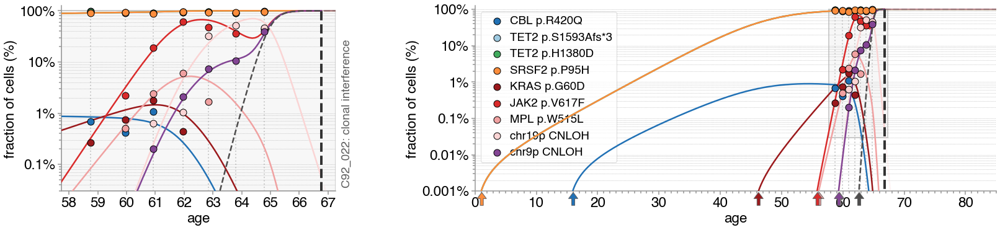

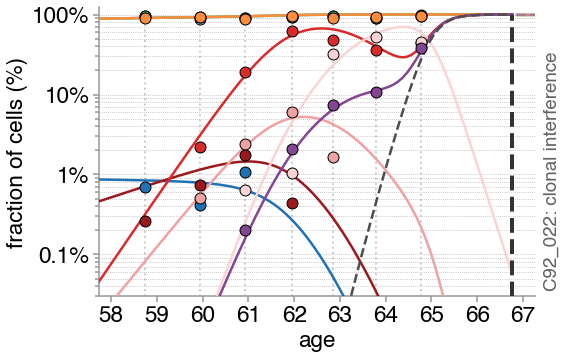

,exac,clin_sig,clinvar_dn,cosmic haem,cosmic total
BCORL1_p.F111L,1.0,.,.,0.0,23.0
ASXL1_p.L815P,1.0,not_provided,not_specified,0.0,0.0
TP53_p.P72R,0.66,drug_response,CODON_72_POLYMORPHISM|Li-Fraumeni_syndrome_1|H...,0.0,195.0
FLT3_p.T227M,0.5988,not_provided,not_specified,0.0,62.0
TET2_p.I1762V,0.2951,not_provided,not_specified,3.0,14.0
BCORL1_p.G209S,0.073,.,.,1.0,6.0


In [115]:
plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
plot_trajectories_cell_fractions_just_zoomed_in(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)

In [116]:
C92_022_tau_times

{('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H'): 0.1,
 ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'MPL_p.W515L'): 54.56,
 ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'JAK2_p.V617F'): 54.45,
 ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'chr19p_CNLOH'): 58.27,
 ('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H', 'KRAS_p.G60D'): 44.99,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'JAK2_p.V617F',
  'chr9p_CNLOH'): 58.11,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'JAK2_p.V617F',
  'chr9p_CNLOH',
  'X'): 61.62,
 ('CBL_p.R420Q',): 14.99}

In [117]:
C92_022_establishment_times

{('TET2_p.S1593Afs*3', 'TET2_p.H1380D', 'SRSF2_p.P95H'): 1.1011011011011012,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'MPL_p.W515L'): 56.15615615615616,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'JAK2_p.V617F'): 55.85585585585586,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'chr19p_CNLOH'): 59.45945945945946,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'KRAS_p.G60D'): 46.24624624624625,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'JAK2_p.V617F',
  'chr9p_CNLOH'): 59.35935935935936,
 ('TET2_p.S1593Afs*3',
  'TET2_p.H1380D',
  'SRSF2_p.P95H',
  'JAK2_p.V617F',
  'chr9p_CNLOH',
  'X'): 62.66266266266267,
 ('CBL_p.R420Q',): 16.016016016016017}